<a id='up'></a>
# Проект Госпитализация пациентов медицинского центра

Подготовил Лукашевич Тимофей

## Содержание

[Описание проекта](#1)

[Загрузка данных](#2)

[Предобработка данных](#3)

[Исследовательский анализ](#4)

[Аналитическая часть](#5)

[Проверка гипотез](#6)

[Отчет в DataLens](#7)

Ссылка на отчет DataLens: https://datalens.yandex/yuiiscqzr0xul

[Выводы и рекомендации](#8)


<a id='1'></a>
## Описание проекта

ФГБОУ ВО СПбГПМУ Минздрава России (Педиатрический Университет) хочет узнать какие факторы влияют на время, которое проходит от выдачи направления до поступления пациента в медицинский центр.
Дополнительно заказчик просит найти все возможные инсайты в представленных данных (провести ad hoc исследование).

**Задача:** На основании данных о госпитализации пациентов медицинского центра рассчитать длительность в днях, прошедших от выдачи направления до поступления пациента в медицинский центр, определить, что влияет на длительность. Предоставить всю возможную информацию по диагнозам: срок лечения, время в ожидании, прочие факторы. Провести Ad-hoc исследование данных. А также подготовить отчет в BI-системе.

**План проекта:**

1. Загрузить данные с сервера PostgreSQL
2. Провести предобработку данных
    - Исследовать и изменить типы данных
    - Исследовать дубликаты и пропущенные значения
    - Создать новые столбцы
    - Рассчитать длительность в днях, прошедших от выдачи направления до поступления пациента в медицинский центр
3. Провести исследовательский анализ данных
    - Провести разведочный анализ данных при помощи библиотеки ydata_profiling
    - Исследовать все столбцы, определить выбросы и аномалии
    - Создать таблицу с очищенными данными
4. Аналитическая часть
    - Определить какие факторы влияют на время поступления пациента
    - Проверить наличие корреляции при помощи библиотеки phik
    - Провести углубленное исследование диагнозов
5. Сформировать и проверить гипотезы
6. Сделать выводы и предложить рекомендации
7. Подготовить отчет в BI-системе DataLens

   
**Описание данных:**

Информация о работе медицинского центра (английские названия - названия столбцов в базе данных):

- referral_date  - Дата выдачи направления на лечение пациенту
- income_date - Дата поступления пациента в отделение
- outcome_date - Дата выписки пациента из отделения
- user_id - Идентификатор пациента
- is_num - Системное поле (номер информационной безопасности)
- code – Системное поле
- region - Регион проживания пациента
- payer - Наименование плательщика
- fin_source - ОМС или другой вариант
- dept - Название отделения
- profile - Профиль отделения (терапия, хирургия и т.д.)
- bed_days - Сколько дней лечения в стационаре у пациента
- is_plan - Поступил планово или экстренно
- income_mkb - Код диагноза при поступлении
- outcome_mkb - Код диагноза при выписке

В файле mkb представлена информация о диагнозах: код диагноза, код родителя и описание болезни, соответствующее коду МКБ.

<a id='2'></a>
## Загрузка данных

Импорт необходимых для работы библиотек:

In [1]:
import pandas as pd
import numpy as np
from sqlalchemy import create_engine
from dotenv import dotenv_values
import re
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import phik
from phik import report
import scipy.stats as st
import warnings
warnings.filterwarnings('ignore')

Загрузка файлов происходит с SQL сервера (Postgre) с помощью библиотеки sqlalchemy:

In [2]:
path = 'D:\\da_projects\\hospital'
config = dotenv_values(path+'\\pass.env')
db_config = {
    'user': config['user'],
    'pwd': config['pwd'],
    'host': '158.160.146.146',
    'port': '5432',
    'db': 'hospital_db'
}
connection_string = 'postgresql://{user}:{pwd}@{host}:{port}/{db}'.format(**db_config)
engine = create_engine(connection_string)

In [3]:
# SQL-запрос
query = '''
select *
from beds
'''

Преобразуем полученные данные в датафрейм pandas и посмотрим на размер и первые строки:

In [4]:
raw_data = pd.DataFrame(pd.read_sql_query(query, con = engine))
print(raw_data.shape)
pd.options.display.float_format='{:.2f}'.format # отображение всех значений float в последующих таблицах с 2 знаками после запятой
raw_data.head()

(179559, 16)


,index,referral_date,income_date,outcome_date,user_id,is_num,code,region,payer,fin_source,dept,profile,bed_days,is_plan,income_mkb,outcome_mkb
0,146076,None,15.03.2023,27.03.2023,1212349000.00,7516,5.4.1,None,"ОАО ""ГСМК"" СПб",ОМС,Инфекционное отделение №1,Инфекционные,13.00,Экстренная,L13.9,J06.8
1,146077,25.01.2023,15.03.2023,18.03.2023,1186105000.00,7517,5.666.0,None,ОМС 86 Регион,ОМС,Офтальмологическое,Офтальмологические,3.00,Плановая,H52.1,H52.1
2,146078,08.02.2023,15.03.2023,18.03.2023,1186105000.00,7517,5.666.0,None,ОМС 86 Регион,ОМС,Офтальмологическое,Офтальмологические,3.00,Плановая,H52.1,H52.1
3,146079,15.03.2023,15.03.2023,20.03.2023,134812000.00,7519,5.666.0,None,ОМС 86 Регион,ОМС,Педиатрическое отделение №3,Ревматологические,6.00,Плановая,M32.0,M32.1+
4,146080,None,15.03.2023,22.03.2023,1212364000.00,10073401,5.666.0,None,ОМС 86 Регион,ОМС,ПЦ Отделение физиологии новорожденных,Для новорожденных,8.00,Плановая,P61.1,P61.1


Преобразуем в датафрейм таблицу с данными о болезнях (Международная классификация болезней):

In [5]:
mkb_list = pd.read_excel(path+"\\mkb10.xlsx", header=3)
mkb_list.head()

,Код диагноза,Название диагноза,Код родителя
0,A00-B99,Некоторые инфекционные и паразитарные болезни,NaN
1,A00-A09,Кишечные инфекции,A00-B99
2,A00,Холера,A00-A09
3,A00.0,"Холера, вызванная холерным вибрионом 01, биова...",A00
4,A00.1,"Холера, вызванная холерным вибрионом 01, биова...",A00


Сразу же изменим названия колонок:

In [6]:
mkb_list.columns = ['mkb', 'name', 'parent']
mkb_list.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12256 entries, 0 to 12255
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   mkb     12256 non-null  object
 1   name    12256 non-null  object
 2   parent  12235 non-null  object
dtypes: object(3)
memory usage: 287.4+ KB


Данные загружены корректно, можно приступать к предобработке.

<a id='3'></a>
## Предобработка данных

[В начало проекта](#up)

Стоит отметить, что данные хорошего качества. Заменим типы данных, проверим наличие неявных дубликатов по столбцам (регионам, отделениям и тд), наличие пропусков и дубликатов по строкам. Сначала создадим копию датафрейма для работы:

In [7]:
beds = raw_data.copy()
beds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179559 entries, 0 to 179558
Data columns (total 16 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   index          179559 non-null  int64  
 1   referral_date  99084 non-null   object 
 2   income_date    179559 non-null  object 
 3   outcome_date   179254 non-null  object 
 4   user_id        179266 non-null  float64
 5   is_num         179559 non-null  int64  
 6   code           179559 non-null  object 
 7   region         82008 non-null   object 
 8   payer          179559 non-null  object 
 9   fin_source     179559 non-null  object 
 10  dept           179266 non-null  object 
 11  profile        179266 non-null  object 
 12  bed_days       179254 non-null  float64
 13  is_plan        179559 non-null  object 
 14  income_mkb     179529 non-null  object 
 15  outcome_mkb    179249 non-null  object 
dtypes: float64(2), int64(2), object(12)
memory usage: 21.9+ MB


### Типы данных

Поменяем тип данных для дат:

In [8]:
beds = raw_data.copy()
for col in ['referral_date', 'income_date', 'outcome_date']:
    beds[col] = pd.to_datetime(beds[col], dayfirst=True)

Приведем индексы, ID пользователей и информационное поле 'is_num' в строковый тип, чтобы они не мешали при построении корреляций. Также приведем 'bed_days' в целочисленный тип.

In [9]:
beds['index'] = beds['index'].astype('object')
beds['user_id'] = beds['user_id'].astype('object')
beds['is_num'] = beds['is_num'].astype('object')
beds['bed_days'] = beds['bed_days'].astype('Int64')
beds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179559 entries, 0 to 179558
Data columns (total 16 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   index          179559 non-null  object        
 1   referral_date  99084 non-null   datetime64[ns]
 2   income_date    179559 non-null  datetime64[ns]
 3   outcome_date   179254 non-null  datetime64[ns]
 4   user_id        179266 non-null  object        
 5   is_num         179559 non-null  object        
 6   code           179559 non-null  object        
 7   region         82008 non-null   object        
 8   payer          179559 non-null  object        
 9   fin_source     179559 non-null  object        
 10  dept           179266 non-null  object        
 11  profile        179266 non-null  object        
 12  bed_days       179254 non-null  Int64         
 13  is_plan        179559 non-null  object        
 14  income_mkb     179529 non-null  object        
 15  

Корректно заменили типы данных.

### Дубликаты регионов

Приведем регионы к нижнему регистру и посмотрим на уникальные значения:

In [10]:
beds['region'] = beds['region'].str.lower()
print(f'Уникальных значений регионов: {len(beds['region'].sort_values().unique())}')
beds['region'].sort_values().unique()

Уникальных значений регионов: 157


array(['-', '\\', 'абхазия', 'агинск.бурят.ао(ф93)',
       'азербайджанская респ', 'алтайский край', 'амурская область',
       'армения', 'архангельская обл.', 'астраханская',
       'астраханская обл.', 'белгородская обл.', 'боливия', 'бомжи',
       'брянская обл.', 'владимирская обл.', 'волгоградская обл.',
       'вологодская обл.', 'воронежская обл.', 'всеволожский район',
       'г мурино', 'г. москва', 'г.байконур', 'г.севастополь', 'г.херсон',
       'дальнее зарубежье', 'днр', 'донецкая народная республика',
       'донецкая обл.', 'донецкая область', 'еврейская ао',
       'забайкальский край', 'запорожская  область', 'запорожская обл.',
       'запорожская область', 'запорожье', 'ивановская обл.',
       'иркутская обл.', 'кабард.-балкарс.респ', 'калининградская обл.',
       'калужская обл.', 'камчатский край', 'карач.-черкесск.респ',
       'кемеровская обл.', 'киргизия', 'кировская обл.',
       'костромская обл.', 'краснодарский край', 'красное село',
       'красноярс

Поменяем названия, повторяющихся регионов (например, 'астраханская' и  'астраханская обл.'):

In [11]:
beds['region'] = (
    beds['region'].str.replace('область', 'обл')
    .str.replace('обл.', 'обл')
    .str.replace('  ', ' ')
    .str.replace('запорожье', 'запорожская обл')
    .str.replace('р-ка', 'респ')
    .str.replace('респ.', 'респ')
    .str.replace('р.', 'респ')
    .str.replace(r'\bреспублика\b', 'респ', regex=True)
    .str.replace('респ-ка', 'респ')
    .str.replace('республ.', 'респ')
)

In [12]:
change = {
    'астраханская':'астраханская обл', 'донецкая народная респ':'днр', 'донецкая обл':'днр', 'г мурино':'г.мурино', 'лнр луганск':'лнр',
    'лениградская обл':'ленинградская обл', 'луганская респ':'лнр', 'луганская народная респ':'лнр', 'луганская обл':'лнр',
    'респ лнр':'лнр', 'лен обл':'ленинградская обл', 'респ донецкая народная':'днр', 'абхазия':'респ абхазия', 'армения':'респ армения',
    'киргизия':'респ киргизия', 'кыргызская респ':'респ киргизия', 'реcпублика украина':'украина', 'респсеверная осетия':'респ северная осетия',
    'туркменистан':'респ туркменистан', 'узбекистан':'респ узбекистан', '-':None, '\\':None
}
for i, j in change.items():
    beds.loc[beds['region']==i, 'region'] = j

In [13]:
print(f'Уникальных значений регионов: {len(beds['region'].sort_values().unique())}')
beds['region'] = beds['region'].str.title() # Сделаем первые буквы в словах заглавными
beds['region'].sort_values().unique()

Уникальных значений регионов: 127


array(['Агинск.Бурят.Ао(Ф93)', 'Азербайджанская Респ', 'Алтайский Край',
       'Амурская Обл', 'Архангельская Обл', 'Астраханская Обл',
       'Белгородская Обл', 'Боливия', 'Бомжи', 'Брянская Обл',
       'Владимирская Обл', 'Волгоградская Обл', 'Вологодская Обл',
       'Воронежская Обл', 'Всеволожский Район', 'Г. Москва', 'Г.Байконур',
       'Г.Мурино', 'Г.Севастополь', 'Г.Херсон', 'Дальнее Зарубежье',
       'Днр', 'Еврейская Ао', 'Забайкальский Край', 'Запорожская Обл',
       'Ивановская Обл', 'Иркутская Обл', 'Кабард.-Балкарс.Респ',
       'Калининградская Обл', 'Калужская Обл', 'Камчатский Край',
       'Карач.-Черкесск.Респ', 'Кемеровская Обл', 'Кировская Обл',
       'Костромская Обл', 'Краснодарский Край', 'Красное Село',
       'Красноярский Край', 'Курганская Обл', 'Курская Обл', 'Латвия',
       'Ленинградская Обл', 'Липецкая Обл', 'Лнр', 'Магаданская Обл',
       'Монголия', 'Московская Обл', 'Мурманская Обл',
       'Неидентифицированные', 'Ненецкий Ао', 'Нидерланды',

Избавились от дубликатов в названиях регионов.

### Сокращение названий отделения

Сократим названия отделений, чтобы они не мешали на графиках:

In [14]:
beds['dept'].sort_values().unique()

array(['Гастроэнтерологическое отделение',
       'Гинекологическое отделение перинатального центра',
       'Дневной стационар Гастроэнтерологического отделения',
       'Дневной стационар Кожно-венерологического отделения',
       'Дневной стационар Онкогематологического отделения',
       'Дневной стационар ПО1', 'Дневной стационар ПО2',
       'Дневной стационар ПО3',
       'Дневной стационар эндокринологического отд.',
       'Инфекционно-диагностическое', 'Инфекционное отделение №1',
       'Кожно-венерологическое отделение', 'Микрохирургическое отделение',
       'Онкогематологическое отделение',
       'Отделение анестезиологии-реанимации',
       'Отделение для детей с новой коронавирусной инфекцией COVID-19 с палатами реанимации и интенсивной терапии',
       'Отоларингологическое отделение', 'Офтальмологическое',
       'ПЦ Акушерское физиологическое отделение',
       'ПЦ ОАРИТ №2 для беременных, рожениц и родильниц',
       'ПЦ ОАРИТН №1 (новорожденных)',
       'ПЦ Отдел

In [15]:
beds['dept'] = (
    beds['dept'].str.replace('Отделение', 'О')
    .str.replace('отделения', 'О')
    .str.replace('отделение', 'О')
    .str.replace('отд.', 'О')
    .str.replace('Дневной стационар', 'ДС')
    .str.replace('перинатального центра', 'ПЦ') 
)

In [16]:
change = {
    'О для детей с новой коронавирусной инфекцией COVID-19 с палатами реанимации и интенсивной терапии':'О COVID-19 с палатами реанимации',
    'ПЦ ОАРИТ №2 для беременных, рожениц и родильниц':'ПЦ ОАРИТ №2',
    'ПЦ О Анестезиологии-реанимации для детей с кардиохирургической патологией':'ПЦ О реанимации кардио',
    'ПЦ О патологии новорожденных и детей грудного возраста':'ПЦ О патологии новорожденных',
    'ПЦ О вспомогательных репродуктивных технологий ДС':'ПЦ О репродуктивных техн ДС'
}
for i, j in change.items():
    beds.loc[beds['dept']==i, 'dept'] = j
beds['dept'].value_counts()

dept
Педиатрическое О №3                 13320
Кожно-венерологическое О            12820
ПЭМП ДПО                            12659
Офтальмологическое                  12388
Инфекционное О №1                   11621
Хирургическое О №3                  11213
Хирургическое О №1                   9451
ПЦ Акушерское физиологическое О      8895
Педиатрическое О №2                  8810
ПЦ О физиологии новорожденных        8521
Хирургическое О №2                   8192
Микрохирургическое О                 8056
Отоларингологическое О               7847
Гастроэнтерологическое О             7694
Психоневрологическое О               7223
Эндокринологическое О                6375
Педиатрическое О №1                  5592
Гинекологическое О ПЦ                5503
ПЦ О патологии новорожденных         3575
Инфекционно-диагностическое          2454
ПЦ О патологии беременности          1395
ПЦ О репродуктивных техн ДС          1247
Онкогематологическое О               1157
О COVID-19 с палатами реанима

Сократили названия отделений.

### Другие значения

Проверим названия по другим колонкам:

In [17]:
for col in beds.columns:
    display(beds[col].value_counts())
    display('----------------------------------------------')

index
146076    1
86198     1
86190     1
86191     1
86192     1
         ..
26348     1
26349     1
26350     1
26351     1
146074    1
Name: count, Length: 179559, dtype: int64

'----------------------------------------------'

referral_date
2021-04-05    204
2021-01-11    204
2021-03-22    198
2021-03-29    191
2023-02-20    184
             ... 
2019-01-27      1
2018-05-22      1
2020-06-12      1
2018-02-13      1
2020-01-07      1
Name: count, Length: 1824, dtype: int64

'----------------------------------------------'

income_date
2021-04-12    272
2021-04-05    262
2021-03-15    258
2021-03-22    244
2023-05-10    238
             ... 
2020-05-31     13
2020-05-30     13
2022-12-31     12
2021-08-07      9
2019-08-03      8
Name: count, Length: 1825, dtype: int64

'----------------------------------------------'

outcome_date
2021-04-30    279
2021-04-09    273
2021-04-02    255
2021-03-26    250
2021-04-16    243
             ... 
2024-02-20      1
2024-02-12      1
2024-02-11      1
2024-02-14      1
2024-02-08      1
Name: count, Length: 1870, dtype: int64

'----------------------------------------------'

user_id
231198000.00     135
268497000.00     111
911298000.00     111
803416000.00     108
149908000.00     100
                ... 
1033462000.00      1
1038859000.00      1
1031170000.00      1
848404000.00       1
771424000.00       1
Name: count, Length: 104904, dtype: int64

'----------------------------------------------'

is_num
5725        9
468         8
10533       8
8351        8
7208        8
           ..
10181231    1
10179141    1
10173381    1
10069061    1
10071081    1
Name: count, Length: 46534, dtype: int64

'----------------------------------------------'

code
5.666.0      73780
6.1.0        21046
5.99.0       16386
5.12.1       16139
5.4.1        10837
             ...  
12.3.0.21        1
2.721.6          1
2.715.6          1
12.1.0           1
2.689.1          1
Name: count, Length: 97, dtype: int64

'----------------------------------------------'

region
Ленинградская Обл          26675
Новгородская Обл            6167
Псковская Обл               4003
Вологодская Обл             3896
Респ Карелия                3149
                           ...  
Соединенное Королевство        1
Хасавюрт                       1
Рсо Алания                     1
Красное Село                   1
Эстония                        1
Name: count, Length: 126, dtype: int64

'----------------------------------------------'

payer
ОМС 86 Регион                                                   75124
Высокотехнологичная медицинская помощь                          21046
Фонд-Иногородние                                                16386
ООО "Капитал Медицинское Страхование"                           16139
ОАО "ГСМК" СПб                                                  10837
                                                                ...  
ПАО "Росгосстрах"                                                   1
ПАО "Росгосстрах" (Москва)                                          1
Газпроммедстрах                                                     1
Московская акционерная страховая компания МАКС                      1
Дирекция Северо-Европейского филиала ПАО "САК "ЭНЕРГОГАРАНТ"        1
Name: count, Length: 68, dtype: int64

'----------------------------------------------'

fin_source
ОМС                         145653
ВМП                          21046
не определен                  6199
Клинические апробации         2820
Наличный расчет               2742
ДМС                           1029
Бюджет                          50
Клинические исследования        19
Прочие                           1
Name: count, dtype: int64

'----------------------------------------------'

dept
Педиатрическое О №3                 13320
Кожно-венерологическое О            12820
ПЭМП ДПО                            12659
Офтальмологическое                  12388
Инфекционное О №1                   11621
Хирургическое О №3                  11213
Хирургическое О №1                   9451
ПЦ Акушерское физиологическое О      8895
Педиатрическое О №2                  8810
ПЦ О физиологии новорожденных        8521
Хирургическое О №2                   8192
Микрохирургическое О                 8056
Отоларингологическое О               7847
Гастроэнтерологическое О             7694
Психоневрологическое О               7223
Эндокринологическое О                6375
Педиатрическое О №1                  5592
Гинекологическое О ПЦ                5503
ПЦ О патологии новорожденных         3575
Инфекционно-диагностическое          2454
ПЦ О патологии беременности          1395
ПЦ О репродуктивных техн ДС          1247
Онкогематологическое О               1157
О COVID-19 с палатами реанима

'----------------------------------------------'

profile
Инфекционные                                                            14075
Дерматологические                                                       12796
Ревматологические                                                       12422
Офтальмологические                                                      12388
Хирургические для детей                                                 12070
Уроандрологические                                                       9451
Для беременных и рожениц                                                 8895
Для новорожденных                                                        8521
Отоларингологические                                                     7847
Гастроэнтерологические                                                   7387
Сосудистой хирургии                                                      6647
Эндокринологические                                                      6481
Педиатрические соматические                             

'----------------------------------------------'

bed_days
1      19710
4      16423
5      14407
8      13199
7      12633
       ...  
379        1
191        1
240        1
220        1
164        1
Name: count, Length: 186, dtype: Int64

'----------------------------------------------'

is_plan
Плановая      123887
Экстренная     55672
Name: count, dtype: int64

'----------------------------------------------'

income_mkb
M08.0     7756
L20.8     6338
Z38.0     5511
J03.9     4614
J45.0     3812
          ... 
G46.6*       1
P92.9        1
O86.1        1
S76.4        1
D76.3        1
Name: count, Length: 3497, dtype: int64

'----------------------------------------------'

outcome_mkb
L20.8    8062
Z38.0    5511
M08.0    4883
J03.9    4479
J06.8    4096
         ... 
K72.0       1
N94.5       1
P29.4       1
N17.0       1
G72.3       1
Name: count, Length: 3128, dtype: int64

'----------------------------------------------'

Дубликатов не обнаружено.

### Явные дубликаты

Посмотрим, есть ли явные дубликаты в таблице. Для начала удалим столбец с уникальным номером записи в таблице:

In [18]:
beds = beds.drop(columns='index')
print('Количество дубликатов:', beds.duplicated().sum())
beds = beds.drop_duplicates()
print('Осталось после удаления:', beds.duplicated().sum())

Количество дубликатов: 935
Осталось после удаления: 0


### Пропущенные значения

Посмотрим количество пропусков по колонкам в датафрейме:

In [19]:
beds.isna().sum()

referral_date    80466
income_date          0
outcome_date       305
user_id            293
is_num               0
code                 0
region           97105
payer                0
fin_source           0
dept               293
profile            293
bed_days           305
is_plan              0
income_mkb          30
outcome_mkb        310
dtype: int64

Посмотрим на строки с пропусками в колонке user_id:

In [20]:
beds.loc[beds['user_id'].isna()].describe(include='all')

,referral_date,income_date,outcome_date,user_id,is_num,code,region,payer,fin_source,dept,profile,bed_days,is_plan,income_mkb,outcome_mkb
count,0,293,0,0,293.00,293,0,293,293,0,0,0.00,293,277,0
unique,NaN,NaN,NaN,0,291.00,11,0,11,3,0,0,<NA>,1,41,0
top,NaN,NaN,NaN,NaN,18161.00,5.186.1,NaN,Прочие (без полиса),ОМС,NaN,NaN,<NA>,Плановая,O26.8,NaN
freq,NaN,NaN,NaN,NaN,2.00,271,NaN,271,289,NaN,NaN,<NA>,293,59,NaN
mean,NaT,2021-02-21 20:04:05.733788416,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN
min,NaT,2019-01-05 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN
25%,NaT,2019-12-10 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN
50%,NaT,2020-12-22 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN
75%,NaT,2022-05-03 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN
max,NaT,2023-12-27 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN


- Удалим такие строки, они практически полностью пустые.
- Удалим строки без даты выписки 'outcome_date' (возможно это пациенты, которые до сих пор находятся на лечении).
- Удалим строки с пропущенной информацией о диагнозах 'income_mkb' и 'outcome_mkb'. Таких строк немного.

In [21]:
beds = beds.dropna(subset=['user_id', 'outcome_date', 'income_mkb', 'outcome_mkb'])
beds.isna().sum()

referral_date    80155
income_date          0
outcome_date         0
user_id              0
is_num               0
code                 0
region           96802
payer                0
fin_source           0
dept                 0
profile              0
bed_days             0
is_plan              0
income_mkb           0
outcome_mkb          0
dtype: int64

Посмотрим на пропущенные значения в колонке с датой выдачи направления. Посмотрим какие диагнозы встречаются в этих пропусках:

In [22]:
refg = (
    beds.loc[beds['referral_date'].isna()]
    .groupby('income_mkb').agg({'user_id':'count'})
    .sort_values(by='user_id', ascending=False)
    .reset_index()
    .merge(mkb_list[['mkb', 'name']], left_on='income_mkb', right_on='mkb', how='left')
    .drop(columns='mkb')
)
refg.head(15)

,income_mkb,user_id,name
0,Z38.0,5511,"Один ребенок, рожденный в стационаре"
1,J03.9,4604,Острый тонзиллит неуточненный
2,B27.9,3162,Инфекционный мононуклеоз неуточненный
3,K37,2495,Аппендицит неуточненный
4,J06.9,2446,Острая инфекция верхних дыхательных путей неут...
5,K63.9,2110,Болезнь кишечника неуточненная
6,S62.6,1755,Перелом другого пальца кисти
7,O80.9,1327,Одноплодные самопроизвольные роды неуточненные
8,O42.9,1174,Преждевременный разрыв плодных оболочек неуточ...
9,K35.8,1149,NaN


- K35.8 - Острый аппендицит другой или неуточненный

Эти диагнозы подразумевают экстренную госпитализацию. Из открытых источников удалось выяснить, что это может быть связано с вызовами бригады скорой помощи или другими экстренными случаями (к примеру, для новорожденных создается запись в таблице, но, само собой, не выдается направление). Будем считать такие пропуски случаями день в день.

In [23]:
beds.loc[beds['referral_date'].isna(), 'referral_date'] = beds['income_date']

- Также остались пропуски в графе с регионом.

Посмотрим на пропуски в графе с регионами:

In [24]:
reg = beds.loc[beds['region'].isna()]
beds.loc[beds['user_id'].isin(reg['user_id'])].sort_values(by='user_id').describe(include='all')

,referral_date,income_date,outcome_date,user_id,is_num,code,region,payer,fin_source,dept,profile,bed_days,is_plan,income_mkb,outcome_mkb
count,96802,96802,96802,96802.00,96802.00,96802,0,96802,96802,96802,96802,96802.00,96802,96802,96802
unique,NaN,NaN,NaN,64192.00,41529.00,87,0,59,7,35,43,<NA>,2,2570,2387
top,NaN,NaN,NaN,231198000.00,8350.00,5.666.0,NaN,ОМС 86 Регион,ОМС,ПЭМП ДПО,Инфекционные,<NA>,Плановая,Z38.0,L20.8
freq,NaN,NaN,NaN,123.00,7.00,32717,NaN,33294,80055,10407,10165,<NA>,56214,4035,5060
mean,2021-07-23 12:29:46.872171776,2021-08-06 09:55:27.625462528,2021-08-13 01:18:57.621123328,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.35,NaN,NaN,NaN
min,2002-12-01 00:00:00,2019-01-01 00:00:00,2019-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00,NaN,NaN,NaN
25%,2020-03-18 00:00:00,2020-03-23 00:00:00,2020-03-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.00,NaN,NaN,NaN
50%,2021-09-02 00:00:00,2021-09-17 00:00:00,2021-09-24 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.00,NaN,NaN,NaN
75%,2022-10-31 00:00:00,2022-11-17 00:00:00,2022-11-23 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.00,NaN,NaN,NaN
max,2023-12-30 00:00:00,2023-12-30 00:00:00,2024-02-19 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,427.00,NaN,NaN,NaN


Заполнить пропуски по регионам не представляется возможным. Нет совпадений по номеру пользователя у этих пропусков с пользователями с указанным регионом.

### Неявные дубликаты

Посмотрим на дубликаты без учета даты выдачи направления. Ведь может быть такое, что срок действия направления закончился и открыли новое. Также уберем колонки с наименованием плательщика и кодовыми значениями.

In [25]:
print('Дубликатов:', beds.duplicated(subset=['income_date', 'outcome_date', 'user_id', 'dept', 'income_mkb', 'outcome_mkb']).sum())
beds = beds.drop_duplicates(subset=['income_date', 'outcome_date', 'user_id', 'dept', 'income_mkb', 'outcome_mkb'], keep='last')
print('Осталось:', beds.duplicated(subset=['income_date', 'outcome_date', 'user_id', 'dept', 'income_mkb', 'outcome_mkb']).sum())

Дубликатов: 4916
Осталось: 0


Удалили 4916 таких дубликатов и оставили последнюю дату выдачи направления.

In [26]:
beds[['user_id', 'referral_date']].duplicated().sum()

1584

1584 дубликата по пользователю и дате выдачи направления. Это нормально, ведь в один день можно получить направления на разные процедуры, или в один день могут перевести из одного отделения в другое.

### Новые столбцы

Создадим таблицу beds_new, в которой оставим необходимые для анализа столбцы. Уберем системные поля:

In [27]:
beds_new = beds.drop(columns=['is_num', 'code'])

Создадим поля с годом и месяцем поступления в отделение:

In [28]:
beds_new['year'] = beds_new['income_date'].dt.year
beds_new['month'] = beds_new['income_date'].dt.month
beds_new.head()

,referral_date,income_date,outcome_date,user_id,region,payer,fin_source,dept,profile,bed_days,is_plan,income_mkb,outcome_mkb,year,month
0,2023-03-15,2023-03-15,2023-03-27,1212349000.00,None,"ОАО ""ГСМК"" СПб",ОМС,Инфекционное О №1,Инфекционные,13,Экстренная,L13.9,J06.8,2023,3
2,2023-02-08,2023-03-15,2023-03-18,1186105000.00,None,ОМС 86 Регион,ОМС,Офтальмологическое,Офтальмологические,3,Плановая,H52.1,H52.1,2023,3
3,2023-03-15,2023-03-15,2023-03-20,134812000.00,None,ОМС 86 Регион,ОМС,Педиатрическое О №3,Ревматологические,6,Плановая,M32.0,M32.1+,2023,3
4,2023-03-15,2023-03-15,2023-03-22,1212364000.00,None,ОМС 86 Регион,ОМС,ПЦ О физиологии новорожденных,Для новорожденных,8,Плановая,P61.1,P61.1,2023,3
5,2022-03-16,2023-03-15,2023-04-11,133375000.00,Кабард.-Балкарс.Респ,ОМС 86 Регион,ОМС,Микрохирургическое О,Сосудистой хирургии,28,Плановая,Q27.3,Q27.3,2023,3


Создадим поле 'is_mkb_true' со значениями:
- 'Совпадает' - если диагноз при поступлении совпадает с диагнозом при выписке
- 'Поменялся' - если диагноз изменился в результате пребывания в отделении

И построим круговую диаграмму:

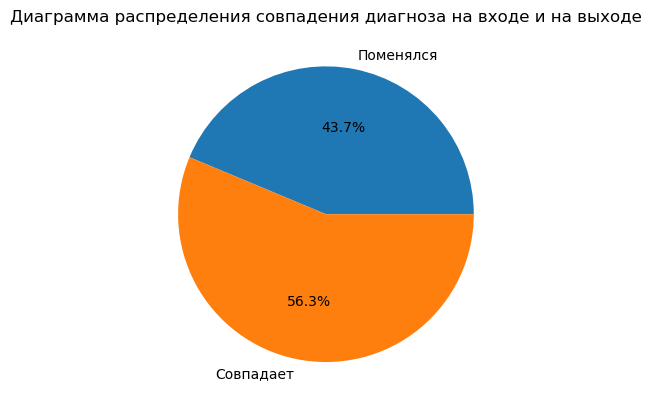

In [29]:
beds_new.loc[beds_new['income_mkb']==beds_new['outcome_mkb'], 'is_mkb_true'] = 'Совпадает'
beds_new.loc[beds_new['income_mkb']!=beds_new['outcome_mkb'], 'is_mkb_true'] = 'Поменялся'
beds_new.groupby('is_mkb_true').agg({'is_mkb_true':'count'})['is_mkb_true'].plot(kind='pie', autopct='%1.1f%%')
plt.title('Диаграмма распределения совпадения диагноза на входе и на выходе')
plt.ylabel('')
plt.show()

В 56.3% случаев диагноз на входе совпадает с диагнозом на выходе.

Создадим столбец "waiting_days", в котором будет целое число, отображающее количество дней с момента выдачи направления до даты поступления в отделение:

In [30]:
beds_new['waiting_days'] = ((beds_new['income_date']-beds_new['referral_date'])/pd.Timedelta(days=1)).astype('Int64')
beds_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 173386 entries, 0 to 179558
Data columns (total 17 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   referral_date  173386 non-null  datetime64[ns]
 1   income_date    173386 non-null  datetime64[ns]
 2   outcome_date   173386 non-null  datetime64[ns]
 3   user_id        173386 non-null  object        
 4   region         78407 non-null   object        
 5   payer          173386 non-null  object        
 6   fin_source     173386 non-null  object        
 7   dept           173386 non-null  object        
 8   profile        173386 non-null  object        
 9   bed_days       173386 non-null  Int64         
 10  is_plan        173386 non-null  object        
 11  income_mkb     173386 non-null  object        
 12  outcome_mkb    173386 non-null  object        
 13  year           173386 non-null  int32         
 14  month          173386 non-null  int32         
 15  is_mk

### Выводы по предобработке

Посмотрим сколько данных мы отсекли:

In [31]:
print('Строк в очищенном датасете:', len(beds_new))
print(
    f'Избавились от дубликатов в размере {len(raw_data)-len(beds_new)}'
    f' строк или {round((len(raw_data)-len(beds_new))/len(raw_data)*100, 2)}%'
)

Строк в очищенном датасете: 173386
Избавились от дубликатов в размере 6173 строк или 3.44%


- Изменили тип данных в столбцах.
- Избавились от дубликатов в названиях регионов (Сократили количество уникальных названий  регионов с 157 до 127).
- Сократили названия отделений для удобства отображения на графиках.
- Исследовали дубликаты и пропущенные значения.
- Удалили 935 явных дубликатов.
- Удалили более 5000 неявных дубликатов.
- Заполнили пропущенные значения в колонке с датой выдачи направления на дату поступления в отделение.
- Создали 4 новых столбца (год и месяц поступления, дни ожидания госпитализации и "правильность" диагноза).

<a id='4'></a>
## Исследовательский анализ данных


[В начало проекта](#up)

Будем использовать отчет библиотеки ydata_profiling для проведения разведывательного анализа данных (EDA).

### Отчет ydata profiling 

In [32]:
ProfileReport(beds_new, title='beds_new report')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Построим дополнительные графики, определим выбросы и аномалии и сделаем выводы.

### Дни ожидания госпитализации

Посмотрим сколько времени проходит с момента выдачи направления до даты поступления пациента в отделение.

In [33]:
beds_new['waiting_days'].describe()

count   173386.00
mean        20.07
std         60.76
min        -28.00
25%          0.00
50%          0.00
75%         18.00
max       8413.00
Name: waiting_days, dtype: Float64

Получили от заказчика информацию, что максимальный срок заявки на госпитализации -  один год. В нашем случае наше максимальное значение 8413 дня. Оставим в таблице данные с 'waiting_days' меньше 395 (возьмем запас в один месяц на случай форс-мажоров, праздников и тому подобное):

In [34]:
print('Количество пациентов с аномально высоким показателем ожидания госпитализации:', len(beds_new[beds_new['waiting_days']>=395]))
beds_new = beds_new[(beds_new['waiting_days']<395) | (beds_new['waiting_days'].isna())]

Количество пациентов с аномально высоким показателем ожидания госпитализации: 232


Удалили 232 таких строки.

Также видим, что в колонке есть данные с отрицательным значением (например -28). Заказчик объяснил этот момент: решения о госпитализации принимались день в день и протокол не успевали создавать вовремя. Считаем эти случаи отбором день в день.

Изменим дату в этих колонках и пересчитаем значения "waiting_days" после изменения дат:

In [35]:
print('Количество отрицательных значений ожидания:', len(beds_new[(beds_new['waiting_days']<0)]))
beds_new.loc[beds_new['waiting_days']<0, 'referral_date'] = beds_new['income_date']
beds_new['waiting_days'] = ((beds_new['income_date']-beds_new['referral_date'])/pd.Timedelta(days=1)).astype('Int64')
print('Количество отрицательных значений ожидания осталось:', len(beds_new[(beds_new['waiting_days']<0)]))
beds_new['waiting_days'].describe()

Количество отрицательных значений ожидания: 9
Количество отрицательных значений ожидания осталось: 0


count   173154.00
mean        19.26
std         46.49
min          0.00
25%          0.00
50%          0.00
75%         18.00
max        394.00
Name: waiting_days, dtype: Float64

In [36]:
beds_new['waiting_days'].describe()

count   173154.00
mean        19.26
std         46.49
min          0.00
25%          0.00
50%          0.00
75%         18.00
max        394.00
Name: waiting_days, dtype: Float64

Теперь максимальный срок ожидания госпитализации составляет 394 дня.

### Даты

Даты по результатам ydata_profilling:
- В моем распоряжении данные о госпитализации пациентов (income_date) с 2019-01-01 по 2023-12-01.
- Дата выписки пациента из отделения (outcome_date) с 2019-01-01 по 2024-03-00.
- Дата выдачи направления на лечение пациенту: минимальное значение согласно анализу 2000-10-1, максимальное - 2023-12-30.

Посмотрим на общую динамику выданных направлений, дату поступления и выписки. Для этого построим 3 линии, предварительно "сгладив" их с помощью метода rolling:

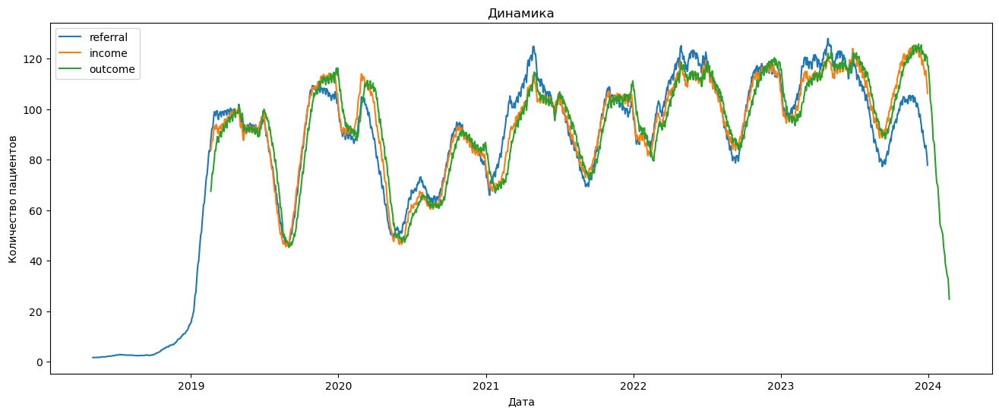

In [37]:
plt.figure(figsize=(16,6))
plt.plot(beds_new.groupby('referral_date').agg({'referral_date':'count'}).rolling(50).mean(), label='referral')
plt.plot(beds_new.groupby('income_date').agg({'income_date':'count'}).rolling(50).mean(), label='income')
plt.plot(beds_new.groupby('outcome_date').agg({'outcome_date':'count'}).rolling(50).mean(), label='outcome')
plt.title('Динамика')
plt.xlabel('Дата')
plt.ylabel('Количество пациентов')
plt.legend()
plt.show()

Даты распределены равномерно. В начале 2021 года выданных направлений было больше нежели поступивших и выписавшихся пациентов. Наблюдается резкий взрыв по всем датам в конце 2019 - начала 2020 года - это может быть связано с эпидемией коронавируса. К концу 2023 года на своем пике поступления пациентов по отделениям.

#### Функция для построения гистограммы

In [38]:
'''
Функция для построения гистограммы.
На вход принимает датафрейм (data) и столбец (x), по которому строим гистрограмму, а также количество бинов (bins).
'''
def make_hist(data, x, bins):
    plt.figure(figsize=(16,6))
    fig = sns.histplot(data=data, bins=bins, x=x, kde=True)
    fig.set_title(f'Гистограмма распределения {x}')
    fig.set_xlabel('Дата')
    fig.set_ylabel('Количество пациентов')
    sns.despine()

Посмотрим на распределение даты после чистки:

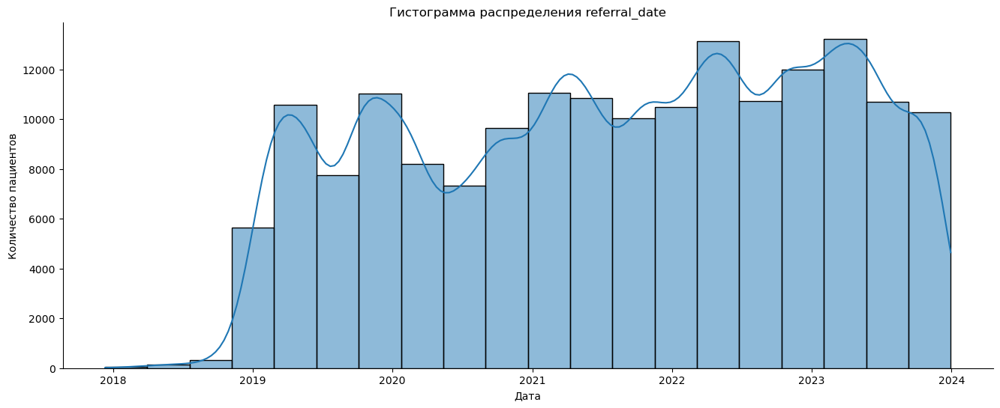

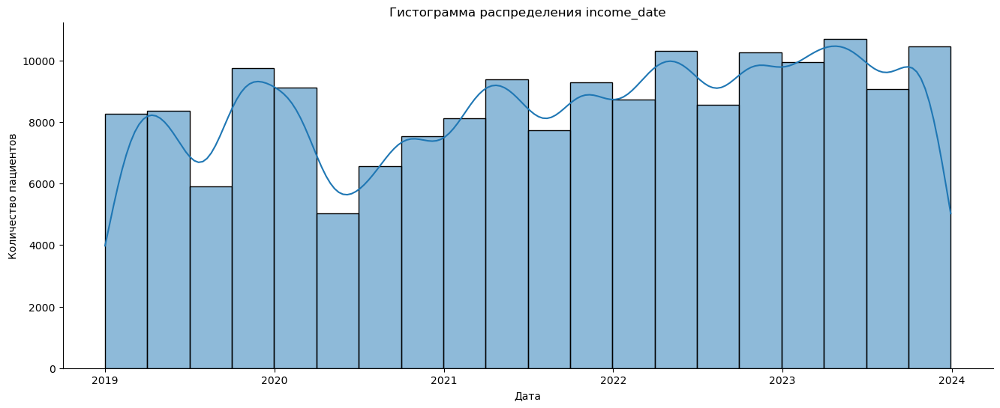

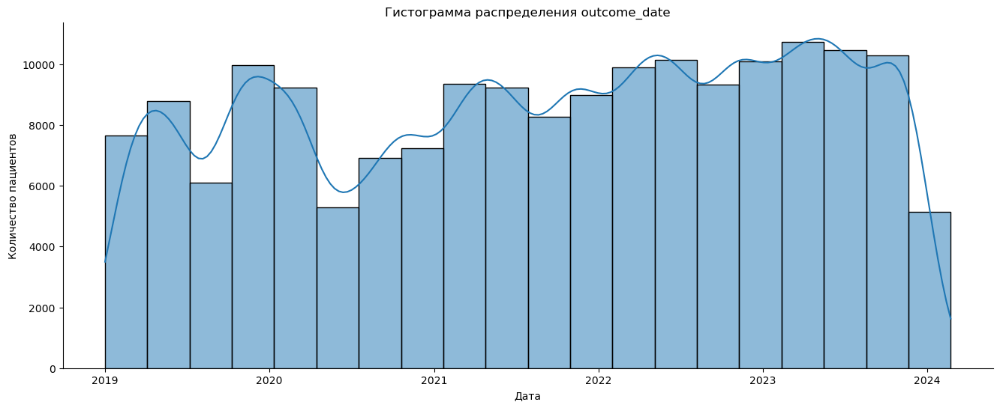

In [39]:
for col in ['referral_date', 'income_date', 'outcome_date']:
    make_hist(beds_new, col, 20)

In [40]:
beds_new['referral_date'].describe()

count                           173154
mean     2021-08-05 19:14:51.049585920
min                2017-12-11 00:00:00
25%                2020-05-02 00:00:00
50%                2021-09-21 00:00:00
75%                2022-11-09 00:00:00
max                2023-12-30 00:00:00
Name: referral_date, dtype: object

- Также виден резкий всплес поступивших в конце 2019 года.
- Теперь минимальная дата выдачи направления - 2017-12-11.

### Пациенты

- Имеем данные об 104904 уникальных пациентах

#### Функция графика для топ-10 и диаграммы рассеяния

In [41]:
'''
Функция принимает на вход колонку из таблицы beds_new (col), по которой необходимо получить статистику.
На выходе получаем таблицу топ-10 часто встречающихся по показателю, значение 1 и 99 перцентиля,
столбчатую диаграмму топ-10 и диаграмму рассеяния по колонке
'''

def top_10_scatter(col):
    group = beds_new.groupby(col).agg({'user_id':[('count','count')]}).droplevel(0, axis=1).reset_index()
    group['percent_of_total'] = round(group['count']/len(beds_new)*100, 2)
    group[col] = group[col].astype('str')
    display(group.sort_values(by='count', ascending=False).head(10)) # вывод сгруппированной таблицы на экран

    plt.figure(figsize=(16,12))
    ax1 = plt.subplot(2, 1, 1) # построение столбчатой диаграммы
    fig = sns.barplot(
        data=group.sort_values(by='count', ascending=False).head(10),
        x='count',
        y=col,
        palette='Blues_d',
        hue=col,
        ax=ax1
    )
    fig.set_title(f'Топ-10 {col}')
    fig.set_xlabel('Количество упоминаний')
    fig.set_ylabel(f'{col}')
    sns.despine()

    ax2 = plt.subplot(2, 1, 2) # построение диаграммы рассеяния
    x_values = pd.Series(range(0,len(group)))
    fig = sns.scatterplot(data=group, x=x_values, y='count', ax=ax2)
    fig.set_title(f'Диаграмма рассеяния {col}')
    fig.set_xlabel(f'Уникальный {col}')
    fig.set_ylabel('Количество')
    sns.despine()
    print('1 и 99 перцентили равны соответственно:', np.percentile(group['count'],[1, 99], method='nearest')) # перцентили
    return group # возвращает таблицу для дальшейшей работы

Применим функцию к столбцу с уникальными пациентами:

,user_id,count,percent_of_total
5049,231198000.0,119,0.07
19950,911298000.0,89,0.05
14825,803416000.0,88,0.05
6820,268497000.0,87,0.05
2511,149908000.0,83,0.05
31354,1007806000.0,83,0.05
22256,944332000.0,72,0.04
21137,929228000.0,72,0.04
8622,301505000.0,70,0.04
47479,1057943000.0,70,0.04


1 и 99 перцентили равны соответственно: [ 1 10]


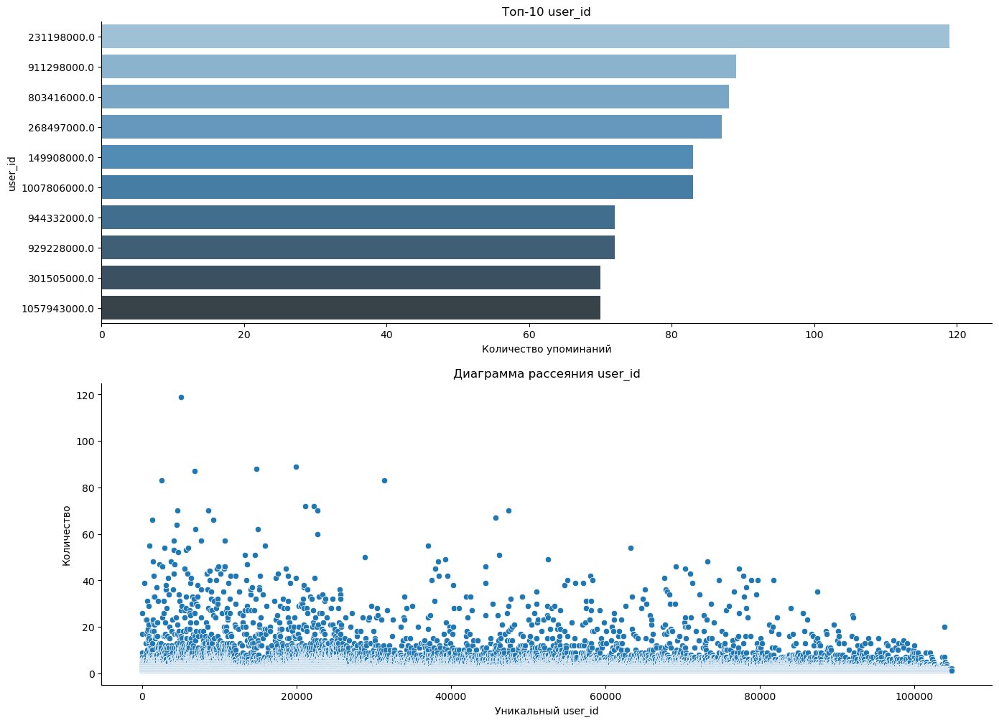

In [42]:
users = top_10_scatter('user_id')

Об одном из пациентов есть 119 упоминаний в таблице. В 99 процентах случаев на одного пацента приходится не более 10 вызовов.

Аномальными будем считать пациентов, на которых приходится более 20 записей:

In [43]:
many_users = users.loc[users['count']>20]['user_id']
print('Таких пациентов', len(many_users))

Таких пациентов 356


### Регионы

- В расположении 126 уникальных регионов.
- 94979 пропущенных значений (54.8%).

Посмотрим на количество обращений по регионам:

,region,count,percent_of_total
41,Ленинградская Обл,25690,14.84
52,Новгородская Обл,5821,3.36
62,Псковская Обл,3775,2.18
12,Вологодская Обл,3661,2.11
75,Респ Карелия,2993,1.73
47,Мурманская Обл,2857,1.65
71,Респ Дагестан,2641,1.53
28,Калининградская Обл,1947,1.12
119,Чеченская Респ,1780,1.03
35,Краснодарский Край,1550,0.90


1 и 99 перцентили равны соответственно: [   1 5821]


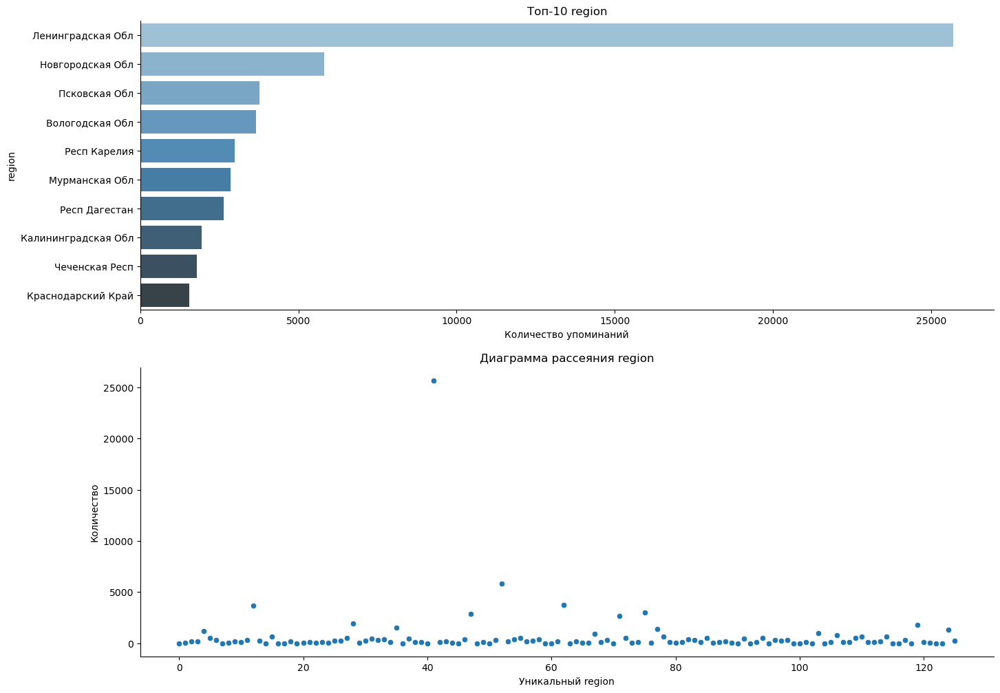

In [44]:
regions = top_10_scatter('region')

Большинство пациентов больницы из Ленинградской области - 25690 или 14.84%. Большое количество пациентов из дальних от Ленинградской области республик.

Аномальными будем считать пользователей из регионов, в которых менее 1000 записей.

In [45]:
few_region = regions[regions['count']<1000]['region']
print('Таких регионов', len(few_region))

Таких регионов 112


Оставим в таблице данные о 15 регионах.

### Наименование платетельщика

В распоряжении 68 уникальных наименований платетельщика.

,payer,count,percent_of_total
29,ОМС 86 Регион,69470,40.12
7,Высокотехнологичная медицинская помощь,20844,12.04
63,Фонд-Иногородние,16259,9.39
32,"ООО ""Капитал Медицинское Страхование""",16120,9.31
27,"ОАО ""ГСМК"" СПб",10816,6.25
61,"Филиал ОАО ""СОГАЗ"" в Санкт-Петербурге",9049,5.23
50,"СПб филиал ООО ""СМК РЕСО - Мед""",6827,3.94
26,Новорожденные в ПЦ,6197,3.58
56,"Страховая компания ""РОСНО""",3897,2.25
60,"Филиал ЗАО ""Маск-М"" г. Санкт-Петербург",3118,1.80


1 и 99 перцентили равны соответственно: [    1 20844]


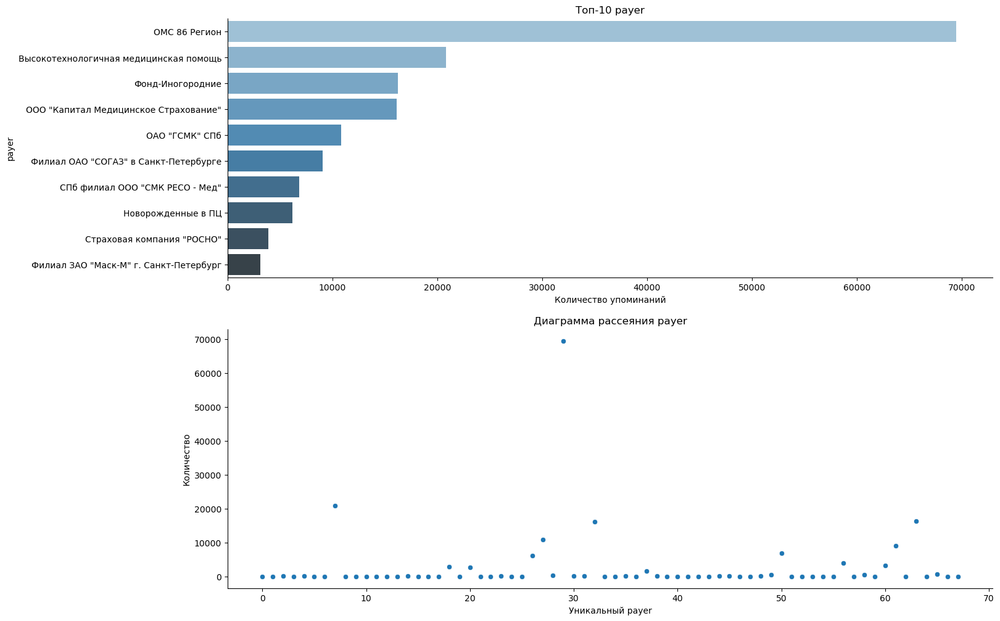

In [46]:
payers = top_10_scatter('payer')

ОМС 86 Регион - с отрывом самый популярный плательщик с отрывом - 40.12% случаев оплачивает именно он. Высокотехнологичная медицинская помощь на втором месте - 12.04%.

### Финансовый источник

Всего 9 источников.

,fin_source,count,percent_of_total
6,ОМС,139506,80.57
1,ВМП,20844,12.04
8,не определен,6197,3.58
3,Клинические апробации,2780,1.61
5,Наличный расчет,2737,1.58
2,ДМС,1022,0.59
0,Бюджет,48,0.03
4,Клинические исследования,19,0.01
7,Прочие,1,0.00


1 и 99 перцентили равны соответственно: [     1 139506]


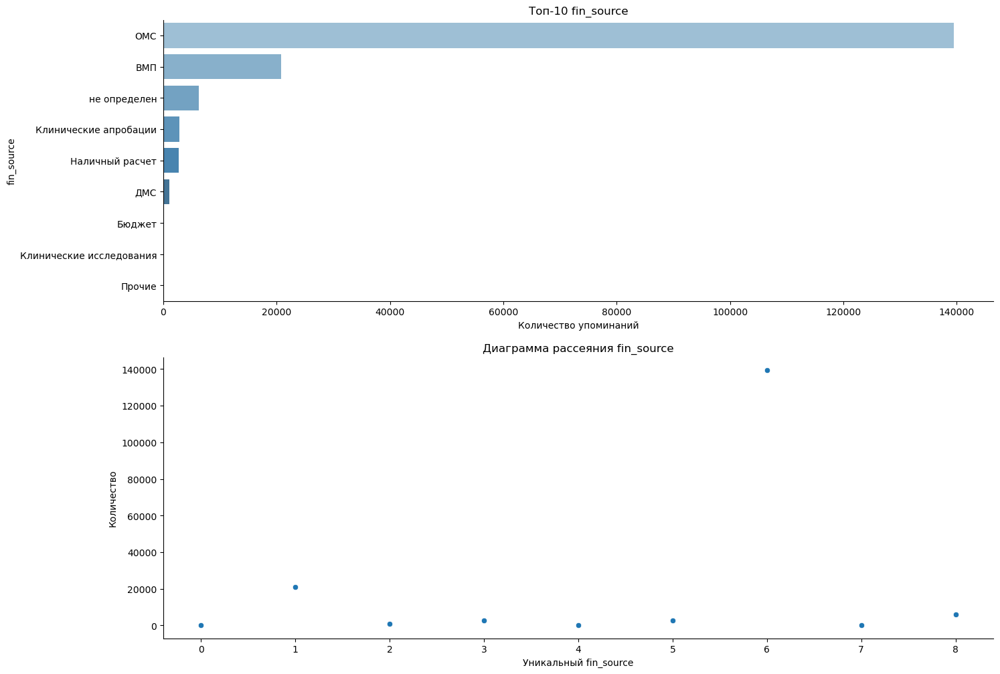

In [47]:
sources = top_10_scatter('fin_source')

80.57% приходятся на источник ОМС.

In [48]:
few_sources = sources[sources['count']<500]['fin_source']
len(few_sources)

3

Не будем учитывать в дальнейшем 3 наименьших источника - бюджет, клинические исследования и прочие.

### Отделения

- 35 уникальных отделений.
- Отделения имеют высокую корреляцию с колонкой профиля и колонкой плановая ли операция.

,dept,count,percent_of_total
29,Педиатрическое О №3,12890,7.44
26,ПЭМП ДПО,12658,7.31
11,Кожно-венерологическое О,11904,6.87
17,Офтальмологическое,11817,6.82
10,Инфекционное О №1,11567,6.68
33,Хирургическое О №3,10865,6.27
18,ПЦ Акушерское физиологическое О,8885,5.13
31,Хирургическое О №1,8685,5.02
23,ПЦ О физиологии новорожденных,8521,4.92
28,Педиатрическое О №2,8437,4.87


1 и 99 перцентили равны соответственно: [    7 12890]


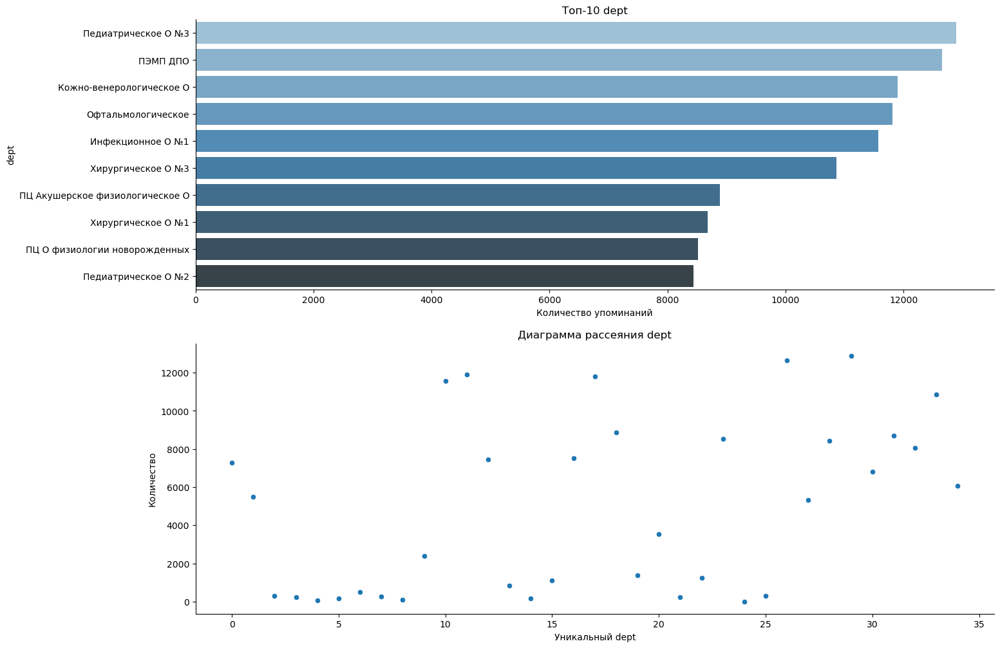

In [49]:
depts = top_10_scatter('dept')

Самое часто встречающееся отделение - Педиатрическое 3 (12890), чуть меньше ПЭМП ДПО (12658) и Кожно-венерологическое О (11904).

Отделения оставляем все.

### Профиль

- В таблице данные о 43 уникальных профилях.

,profile,count,percent_of_total
13,Инфекционные,13957,8.06
34,Ревматологические,12053,6.96
40,Хирургические для детей,11952,6.90
9,Дерматологические,11881,6.86
24,Офтальмологические,11817,6.82
11,Для беременных и рожениц,8885,5.13
39,Уроандрологические,8685,5.02
12,Для новорожденных,8521,4.92
23,Отоларингологические,7533,4.35
3,Гастроэнтерологические,7009,4.05


1 и 99 перцентили равны соответственно: [   15 13957]


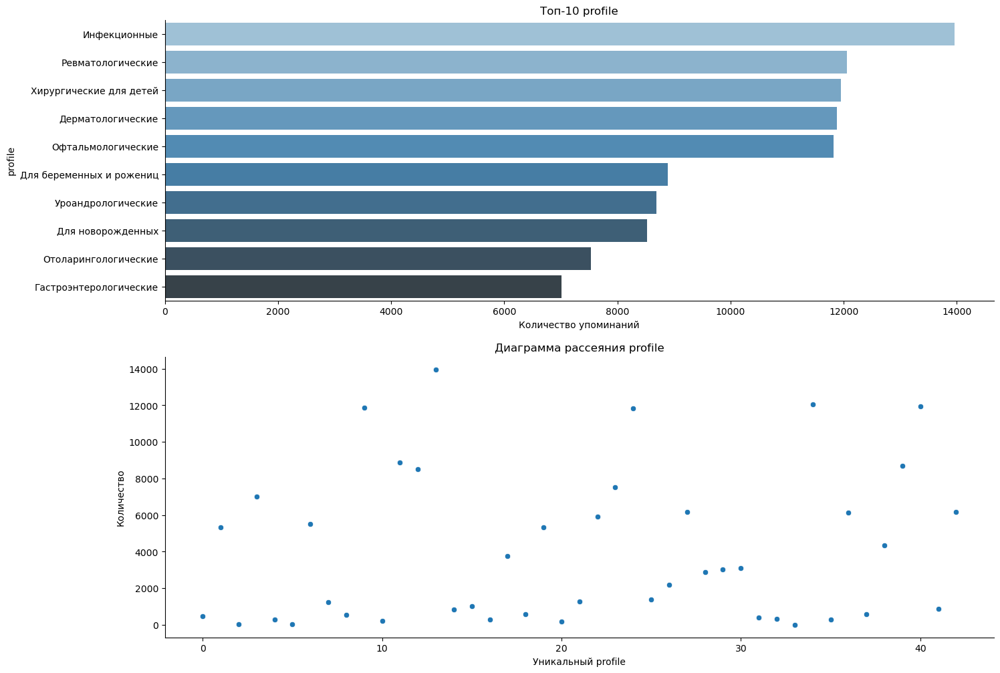

In [50]:
prof = top_10_scatter('profile')

Больше всего инфекционных (13957) и ревматологических (12053) профилей.

Оставляем все.

### План/экстренно

Построим круговую диаграмму распределения поступления в отделение.

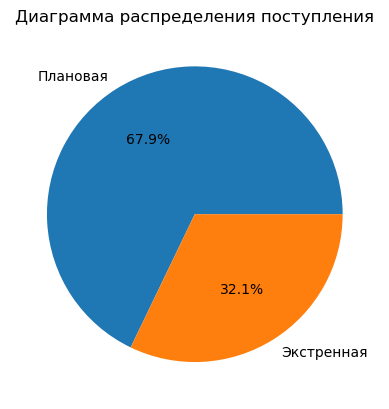

In [51]:
beds_new.groupby('is_plan').agg({'is_plan':'count'})['is_plan'].plot(kind='pie', autopct='%1.1f%%')
plt.title('Диаграмма распределения поступления')
plt.ylabel('')
plt.show()

Плановых поступлений более чем в два раза больше, нежели экстренных. 67.9% против 32.1%.

### Койко-дни и дни ожидания с момента направления

Построим гистограммы распределения койко-дней и дней ожидания:

Описание bed_days
 count   173154.00
mean         8.88
std          9.39
min          1.00
25%          4.00
50%          7.00
75%         11.00
max        427.00
Name: bed_days, dtype: Float64
Описание waiting_days
 count   173154.00
mean        19.26
std         46.49
min          0.00
25%          0.00
50%          0.00
75%         18.00
max        394.00
Name: waiting_days, dtype: Float64


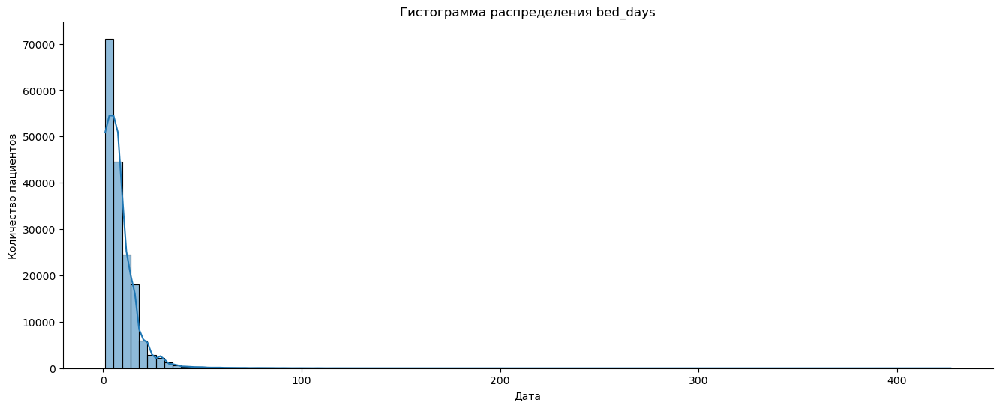

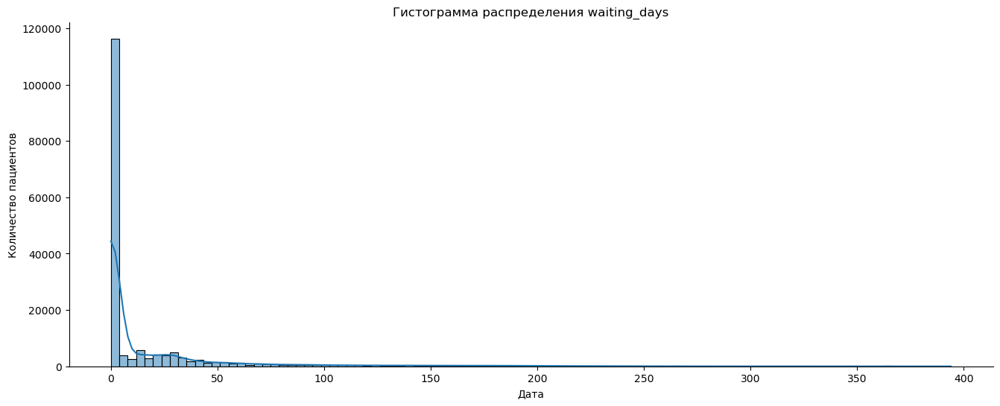

In [52]:
for col in ['bed_days', 'waiting_days']:
    print(f'Описание {col}\n {beds_new[col].describe()}')
    make_hist(beds_new, col, 100)

Среднее число койко-дней - 8.88 дней, ожидания - 19.26. Однако медианное койко-дней - 7 дней, а ожидание - 0. Более 50 процентов пациентов поступает в отделение в день выдачи направления.

### Диагнозы

- 3487 уникальных диагнозов при поступлении.
- 3128 уникальных диагноза при выписке.

Объединить с мкб

,income_mkb,count,percent_of_total
1751,M08.0,7497,4.33
1588,L20.8,5774,3.33
3466,Z38.0,5511,3.18
1199,J03.9,4613,2.66
1285,J45.0,3589,2.07
68,B27.9,3164,1.83
1618,L40.0,2920,1.69
1206,J06.9,2576,1.49
1446,K59.0,2508,1.45
1391,K37,2497,1.44


1 и 99 перцентили равны соответственно: [  1 869]


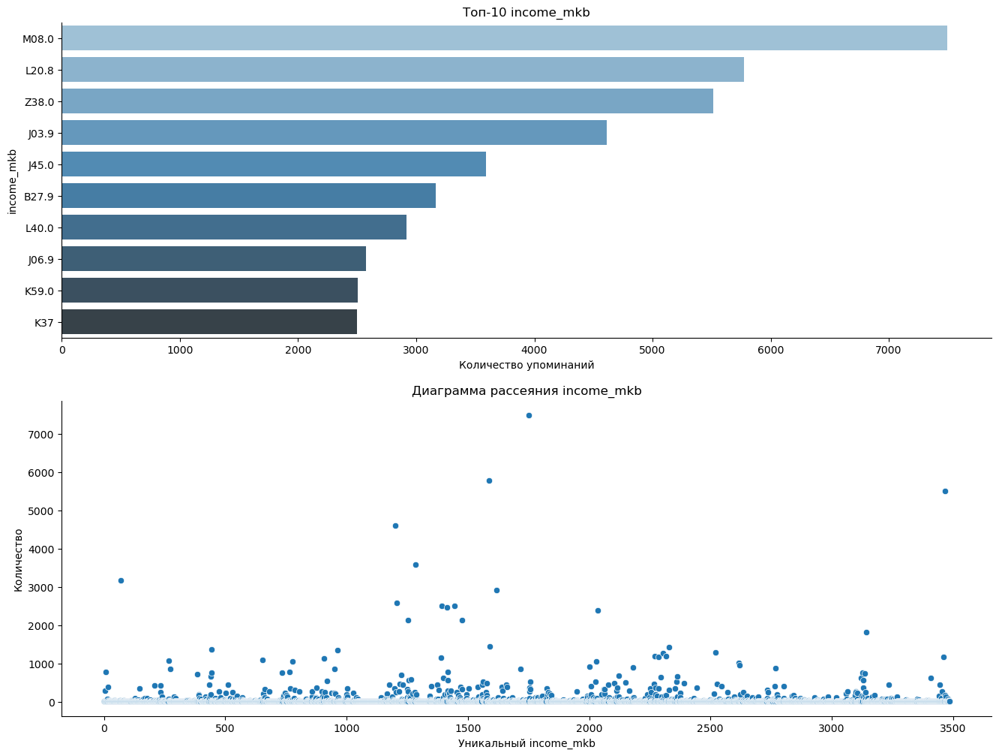

In [53]:
income = top_10_scatter('income_mkb')

Посмотрим на названия популярных диагнозов при поступлении:

In [54]:
(
    income.merge(mkb_list[['mkb', 'name']], left_on='income_mkb', right_on='mkb', how='left')
    .drop(columns='mkb')
    .sort_values(by='count', ascending=False)
    .head(10)
)

,income_mkb,count,percent_of_total,name
1751,M08.0,7497,4.33,Юношеский ревматоидный артрит
1588,L20.8,5774,3.33,Другие атопические дерматиты
3466,Z38.0,5511,3.18,"Один ребенок, рожденный в стационаре"
1199,J03.9,4613,2.66,Острый тонзиллит неуточненный
1285,J45.0,3589,2.07,Астма с преобладанием аллергического компонента
68,B27.9,3164,1.83,Инфекционный мононуклеоз неуточненный
1618,L40.0,2920,1.69,Псориаз обыкновенный
1206,J06.9,2576,1.49,Острая инфекция верхних дыхательных путей неут...
1446,K59.0,2508,1.45,Запор
1391,K37,2497,1.44,Аппендицит неуточненный


Самый часто встречающийся диагноз - Юношеский ревматоидный артрит - 7497 или 4.33%, далее идут Другие атопические дерматиты (5774) и Один ребенок, рожденный в стационаре (5511).

Выбросами будем считать диагнозы, которые встречались менее 30 раз.

In [55]:
few_income = income.loc[income['count']<30]['income_mkb']
print('Диагнозов, встречающихся менее 30 раз:', len(few_income))

Диагнозов, встречающихся менее 30 раз: 2907


Далее посмотрим на диагнозы при выписке.

,outcome_mkb,count,percent_of_total
1460,L20.8,7435,4.29
3110,Z38.0,5511,3.18
1593,M08.0,4772,2.76
1100,J03.9,4476,2.58
1106,J06.8,4009,2.32
2134,O80.0,3937,2.27
1189,J45.0,3650,2.11
1491,L40.0,3002,1.73
2141,O82.1,2821,1.63
1359,K63.8,2252,1.30


1 и 99 перцентили равны соответственно: [  1 976]


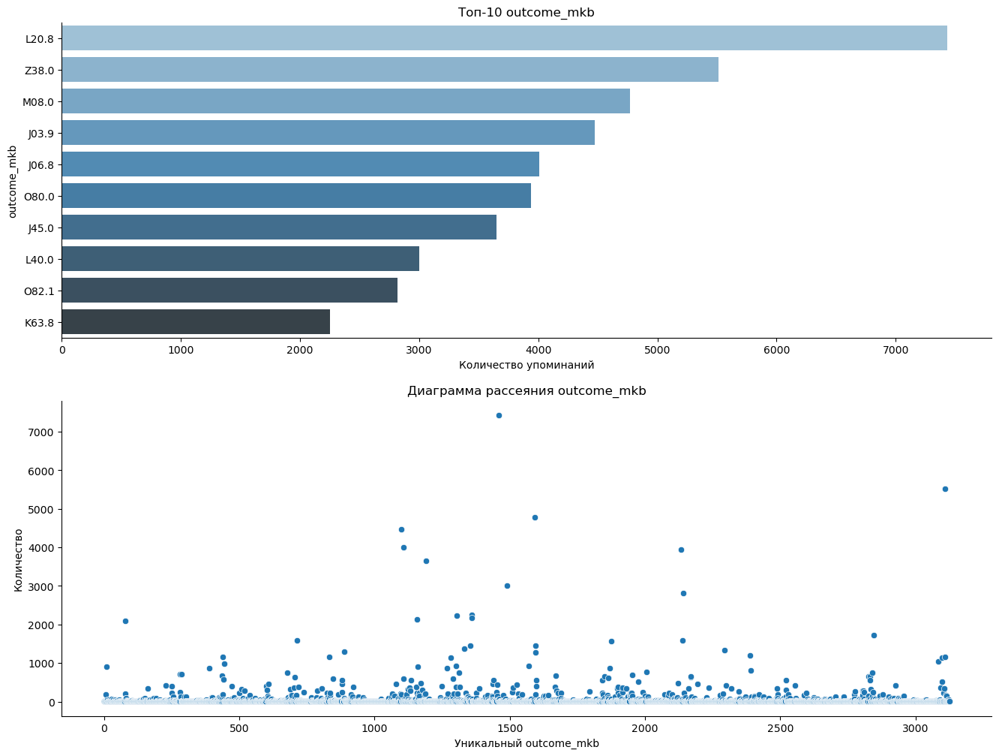

In [56]:
outcome = top_10_scatter('outcome_mkb')

Посмотрим названия диагнозов:

In [57]:
(
    outcome.merge(mkb_list[['mkb', 'name']], left_on='outcome_mkb', right_on='mkb', how='left')
    .drop(columns='mkb')
    .sort_values(by='count', ascending=False)
    .head(10)
)

,outcome_mkb,count,percent_of_total,name
1460,L20.8,7435,4.29,Другие атопические дерматиты
3110,Z38.0,5511,3.18,"Один ребенок, рожденный в стационаре"
1593,M08.0,4772,2.76,Юношеский ревматоидный артрит
1100,J03.9,4476,2.58,Острый тонзиллит неуточненный
1106,J06.8,4009,2.32,Другие острые инфекции верхних дыхательных пут...
2134,O80.0,3937,2.27,Самопроизвольные роды в затылочном предлежании
1189,J45.0,3650,2.11,Астма с преобладанием аллергического компонента
1491,L40.0,3002,1.73,Псориаз обыкновенный
2141,O82.1,2821,1.63,Проведение срочного кесарева сечения
1359,K63.8,2252,1.30,Другие уточненные болезни кишечника


Лидер - Другие атопические дерматиты, количество таких диагнозов увеличилось до 7435 случаев или 4.29% (при поступлении было 5774 случаев). Далее идет Один ребенок, рожденный в стационаре - 5511 случаев (количество не изменилось) и Юношеский ревматоидный артрит - 4772 случаев (при поступлении 7497)

Не будем считать выбосами диагнозы при выписке.

### Избавляемся от выбросов

Создадим датафрейм clean, куда не войдут значения, которые мы признали выбросами:

In [58]:
clean = (
    beds_new.loc[~(beds_new['user_id'].isin(many_users))
    &(~beds_new['region'].isin(few_region))
    &(~beds_new['fin_source'].isin(few_sources))
    &(~beds_new['income_mkb'].isin(few_income))]
)
clean.describe(include='all')

,referral_date,income_date,outcome_date,user_id,region,payer,fin_source,dept,profile,bed_days,is_plan,income_mkb,outcome_mkb,year,month,is_mkb_true,waiting_days
count,139318,139318,139318,139318.00,51524,139318,139318,139318,139318,139318.00,139318,139318,139318,139318.00,139318.00,139318,139318.00
unique,NaN,NaN,NaN,86911.00,14,57,6,35,43,<NA>,2,580,2013,NaN,NaN,2,<NA>
top,NaN,NaN,NaN,231198000.00,Ленинградская Обл,ОМС 86 Регион,ОМС,Кожно-венерологическое О,Инфекционные,<NA>,Плановая,M08.0,L20.8,NaN,NaN,Совпадает,<NA>
freq,NaN,NaN,NaN,114.00,23318,54390,112230,10583,12360,<NA>,93227,6126,6818,NaN,NaN,81404,<NA>
mean,2021-08-02 01:16:01.305789696,2021-08-20 03:17:24.511118336,2021-08-27 15:20:11.955382784,NaN,NaN,NaN,NaN,NaN,NaN,8.20,NaN,NaN,NaN,2021.13,6.54,NaN,18.08
min,2017-12-11 00:00:00,2019-01-01 00:00:00,2019-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,NaN,NaN,NaN,2019.00,1.00,NaN,0.00
25%,2020-04-16 00:00:00,2020-04-21 00:00:00,2020-04-29 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,3.00,NaN,NaN,NaN,2020.00,3.00,NaN,0.00
50%,2021-09-16 00:00:00,2021-10-04 00:00:00,2021-10-12 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,7.00,NaN,NaN,NaN,2021.00,6.00,NaN,0.00
75%,2022-11-07 00:00:00,2022-11-26 00:00:00,2022-12-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,11.00,NaN,NaN,NaN,2022.00,10.00,NaN,15.00
max,2023-12-30 00:00:00,2023-12-30 00:00:00,2024-02-20 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,427.00,NaN,NaN,NaN,2023.00,12.00,NaN,394.00


Количество уникальных пользователей в очищенном датасете - 86911, уникальных регионов - 14, финансовых источников - 6, диагнозов при поступлении - 580, при выписке - 2013. Среднее число койко-дней в очищенном датасете - 8.2, медианное - 7. Среднее число дней ожидания госпитализации - 18.08, медианное - 0 дней.

### Выводы по исследовательскому анализу

In [59]:
print('Строк в очищенном датасете:', len(clean))
print(
    f'Избавились от выбросов в размере {len(beds_new)-len(clean)}'
    f' строк или {round((len(beds_new)-len(clean))/len(beds_new)*100, 2)}%'
)

Строк в очищенном датасете: 139318
Избавились от выбросов в размере 33836 строк или 19.54%


- С помощью библиотеки ydata_profiling провели разведывательный анализ данных (EDA).
- Имеется 232 аномально высоких значения показателя количества дней ожидания госпитализации, которые мы не оставляли в очищенном датасете. А также 9 отрицательных показателей, которые мы считаем случаями день в день. Максимальный показатель дней ожидания госпитализации - 394 дня.
- 126 уникальных регионов сократили до 14 самых часто встречающихся. Большинство пациентов больницы из Ленинградской области - 25690 или 14.84%. Большое количество пациентов из дальних от Ленинградской области республик.
- ОМС 86 Регион - с отрывом самый популярный плательщик с отрывом - 40.12% случаев оплачивает именно он. Высокотехнологичная медицинская помощь на втором месте - 12.04%.
- Всего 9 финансовых источников. 80.57% приходятся на источник ОМС.
- 35 уникальных отделений. 
Отделения имеют высокую корреляцию с колонкой профиля и колонкой плановая ли операция Самое часто встречающееся отделение - Педиатрическое 3 (12890 случаев).
- Больше всего инфекционных (13957) и ревматологических (12053) профилей.
- Плановых поступлений более чем в два раза больше, нежели экстренных. 67.9% против 32.1%.
- В 56.3% случаев диагноз на входе совпадает с диагнозом на выходе.
- 3487 уникальных диагнозов при поступлении. 3128 уникальных диагноза при выписке.
- Самый часто встречающийся диагноз при поступлении - Юношеский ревматоидный артрит - 7497 или 4.33%, далее идут Другие атопические дерматиты (5774) и Один ребенок, рожденный в стационаре (5511).
- При выписке - Другие атопические дерматиты - 7435 случаев или 4.29%. Далее идет Один ребенок, рожденный в стационаре - 5511 случаев и Юношеский ревматоидный артрит - 4772 случаев.
- Создали очищенный датасет. Количество уникальных пользователей в очищенном датасете - 86911, уникальных регионов - 14, финансовых источников - 6, диагнозов при поступлении - 580, при выписке - 2013. Среднее число койко-дней в очищенном датасете - 8.2, медианное - 7. Среднее число дней ожидания госпитализации - 18.08, медианное - 0 дней.

<a id='5'></a>
## Аналитическая часть:

[В начало проекта](#up)

- Постараемся определить, что влияет на длительность ожидания пациентом госпитализации.
- Проверим наличие корреляции между целевой переменной (waiting_days) и факторами.
- Дополнительно заказчик просит представить всю возможную информацию по диагнозам: срок лечения, время в ожидании, прочие факторы.

#### Функция оценки влияния

Создадим функцию impact_analysis, которая на вход будет принимать колонку, по которой необходимо проанализировать влияние на дни ожидания:

In [60]:
'''
Фукция принимает на вход колонку из таблицы clean (y), по которой необходимо оценить влияние на дни ожидания.
На выходе получаем таблицу топ-10 часто встречающихся по показателю со столбцами: 
уникальный показатель, всего пациентов, количество уникальных пациентов, среднее и медианное значение ожидания.
Также получаем 2 столбчатые диаграммы с топ-10 по наименьшему среднему и медианному времени ожидания по показателю.
Боксплот распределения ожидания для топ-10 популярных значений по показателю.
Динамику по месяцам для топ-10 популярных значений.
'''
def impact_analysis(y): 
    group = (
        clean
        .pivot_table(index=y,
                     values=['user_id', 'waiting_days'],
                     aggfunc={'user_id':['count', 'nunique'], 'waiting_days':['mean', 'median']})
        .droplevel(0, axis=1)
        .sort_values(by='count', ascending=False)
        #.head(10)
        .reset_index()
    ) 
    display(group.head(10)) # вывод сгруппированной таблицы на экран

    plt.figure(figsize=(20,6))
    
    ax1 = plt.subplot(1, 2, 1) # столбчатая диаграмма топ-10 по среднему времени ожидания
    fig = sns.barplot(
        data=group.sort_values(by='mean').head(10),
        x='mean',
        y=y,
        palette='Blues_d',
        hue=y,
        ax=ax1
    )
    fig.set_title(f'Среднее время ожидания госпитализации по {y}')
    fig.set_xlabel('Ожидание госпитализации (Дни)')
    fig.set_ylabel(f'{y}')
    sns.despine()

    ax2 = plt.subplot(1, 2, 2)  # столбчатая диаграмма топ-10 по медианному времени ожидания
    fig = sns.barplot(
        data=group.sort_values(by='median').head(10),
        x='median',
        y=y,
        palette='Blues_d',
        hue=y,
        ax=ax2
    )
    fig.set_title(f'Медианное время ожидания госпитализации по {y}')
    fig.set_xlabel('Ожидание госпитализации (Дни)')
    fig.set_ylabel(f'{y}')
    sns.despine()

    plt.figure(figsize=(20,5)) # боксплот для топ-10
    box = clean.loc[clean[y].isin(list(group[y].head(10)))]
    fig = sns.boxplot(data=box, y='waiting_days', x=y, palette='Blues_d', hue=y)
    fig.set_title(f'Боксплот распределения ожидания по {y}')
    fig.set_xlabel(f'{y}')
    fig.set_ylabel('Ожидание госпитализации (Дней)')
    fig.set_ylim(0, 150)
    plt.xticks(rotation=30)
    sns.despine()
    
    dyn = box.pivot_table(index=['year', 'month'], columns=y, values='user_id', aggfunc='count') # динамика по месяцам для топ-10
    dyn.plot(grid=True, marker='o', figsize=(20,10))
    plt.title(f'Динамика поступления по {y}')
    plt.ylabel('Количество случаев')
    plt.xlabel('Дата')
    plt.xticks(np.arange(len(dyn)), dyn.index, rotation=90)
    
    return group # возвращаем таблицу для дальнейшей работы

### Влияние региона на длительность

Посмотрим, есть ли зависимость дней ожидания госпитализации от региона. Для этого применим вышенаписанную функцию к колонке 'region':

,region,count,nunique,mean,median
0,Ленинградская Обл,23318,13440,16.42,0.00
1,Новгородская Обл,5168,2493,32.65,15.00
2,Псковская Обл,3378,1506,38.34,18.00
3,Вологодская Обл,3280,1239,44.83,21.00
4,Респ Карелия,2716,1362,39.93,24.00
5,Мурманская Обл,2579,1309,41.82,23.00
6,Респ Дагестан,2322,1141,16.57,0.00
7,Калининградская Обл,1697,737,41.11,8.00
8,Краснодарский Край,1389,632,37.42,8.00
9,Чеченская Респ,1384,772,11.41,0.00


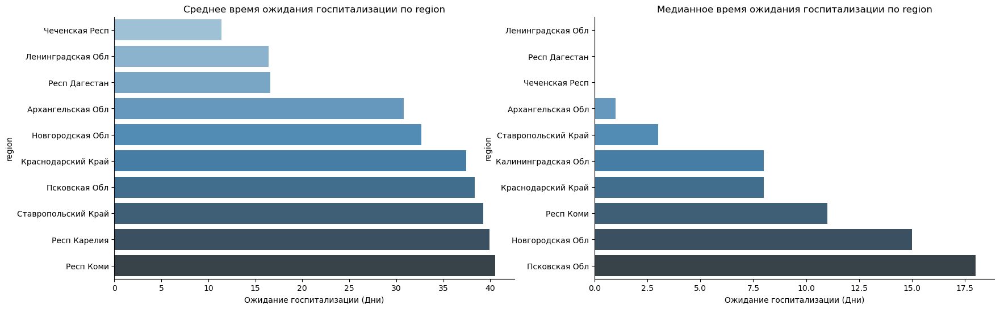

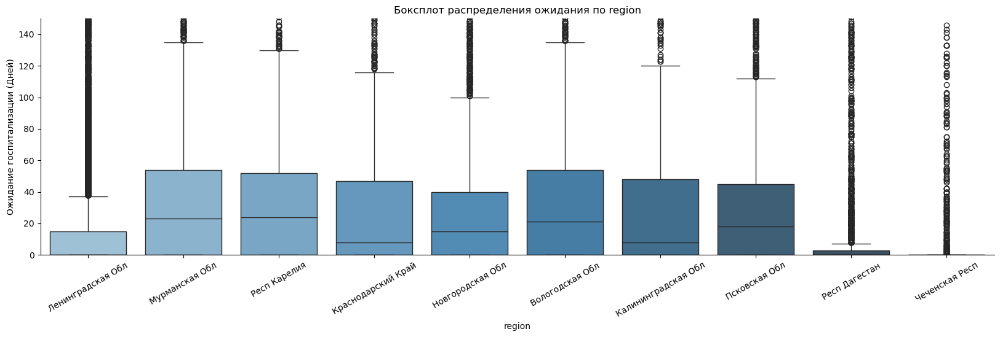

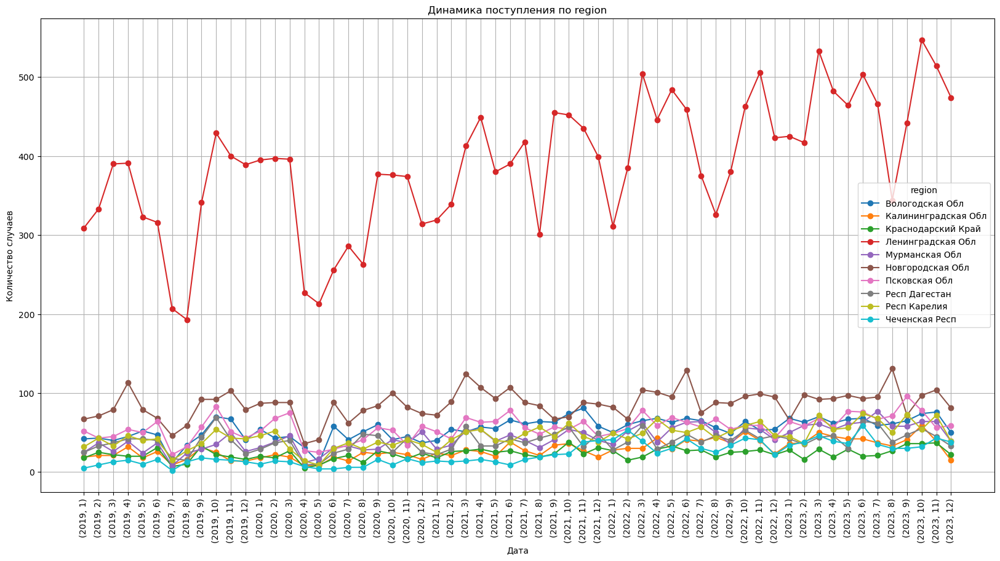

In [61]:
region = impact_analysis('region')

Самый объемный регион Ленинградская область - 23318 записей на 13440 уникальных пациентов. Хороший показатель среднего времени ожидания (16.42 дня) и медианного (0) - это неудивительно, ведь госпиталь располагается в Ленинградской области. Куда удивительней тот факт, что пациенты из Чеченской Республики поступают в госпиталь быстрее всех (среднее время - 11.41), хотя это даже не соседняя область, расстояние от госпиталя более 2000 км. Также быстро поступают пациенты из Республики Дагестан (16.57 дней в среднем). Это единственные 3 региона, которые имеют медианное время ожидания 0 дней. Стоит отметить, что по всем регионам множество выбросов в большую сторону. Динамика по регионам схожая для всех.

### Влияние типа финансирования на ожидание

Посмотрим на тип финансирования:

,fin_source,count,nunique,mean,median
0,ОМС,112230,75539,19.39,0.00
1,ВМП,15911,6104,20.45,4.00
2,не определен,5638,5636,0.00,0.00
3,Клинические апробации,2427,1653,5.85,0.00
4,Наличный расчет,2257,2138,0.53,0.00
5,ДМС,855,808,3.02,0.00


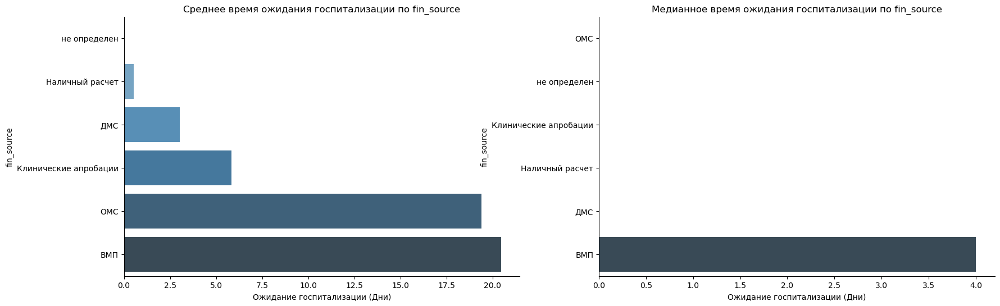

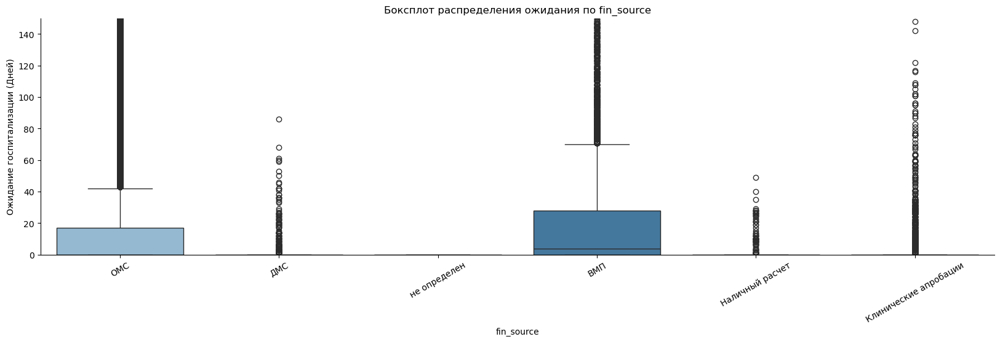

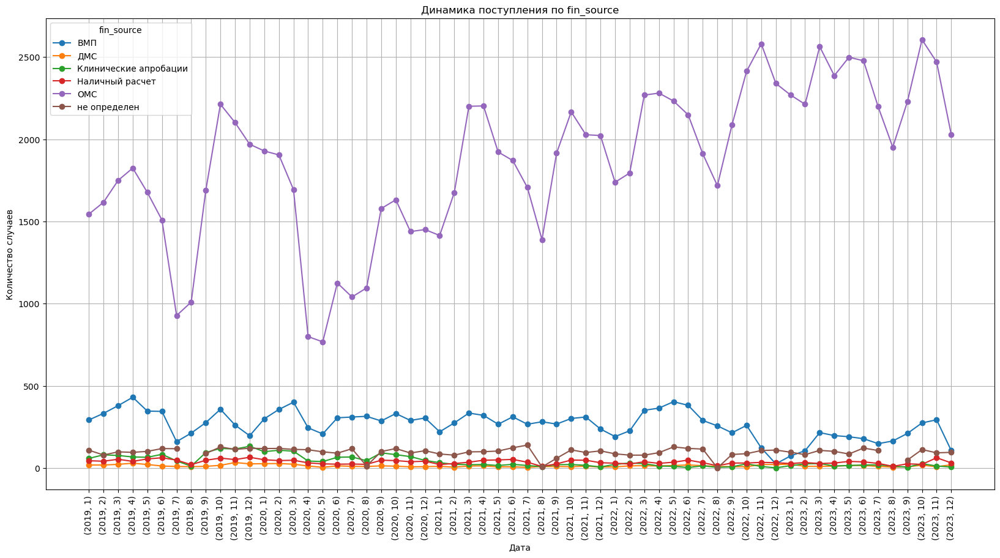

In [62]:
fin = impact_analysis('fin_source')

Самое высокое время ожидания у двух самых объемных источников финансирования: ОМС - 19.39 дней среднее время ожидания госпитализации, ВМП - 20.45. Быстрее всего поступают пациенты по наличному расчету - 0.53 дня среднее время. По неопределенному расчету все пациенты обслуживались день в день (таких 5636 пациентов).

Высокое время ожидание по ОМС связано со сложностью регистрации пациентов. Регистрация проходит в несколько этапов.

### Влияние плательщика

,payer,count,nunique,mean,median
0,ОМС 86 Регион,54390,33684,31.48,3.00
1,Высокотехнологичная медицинская помощь,15911,6104,20.45,4.00
2,"ООО ""Капитал Медицинское Страхование""",14214,12376,3.71,0.00
3,Фонд-Иногородние,10832,8383,23.13,0.00
4,"ОАО ""ГСМК"" СПб",9558,8416,4.27,0.00
5,"Филиал ОАО ""СОГАЗ"" в Санкт-Петербурге",7954,7121,3.36,0.00
6,"СПб филиал ООО ""СМК РЕСО - Мед""",6051,5345,3.90,0.00
7,Новорожденные в ПЦ,5638,5636,0.00,0.00
8,"Страховая компания ""РОСНО""",3439,3069,10.55,0.00
9,"Филиал ЗАО ""Маск-М"" г. Санкт-Петербург",2733,2356,6.41,0.00


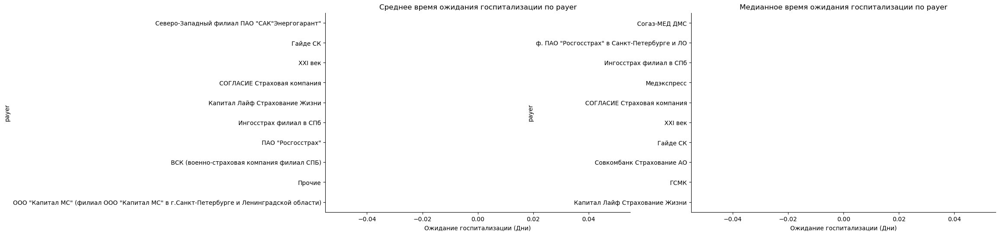

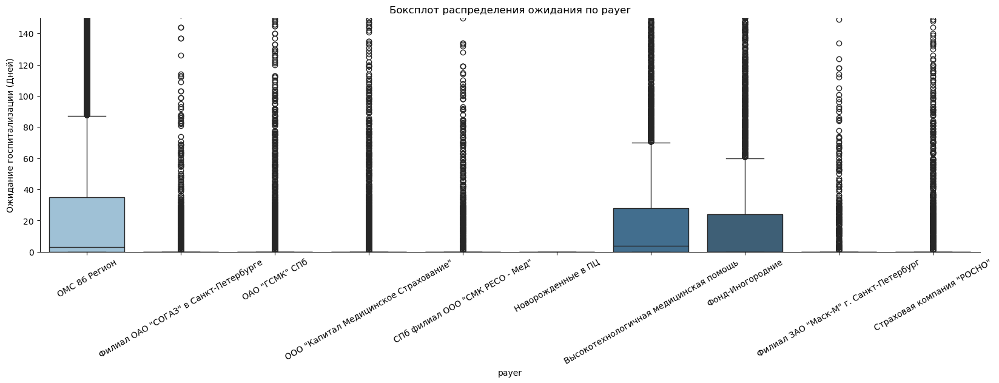

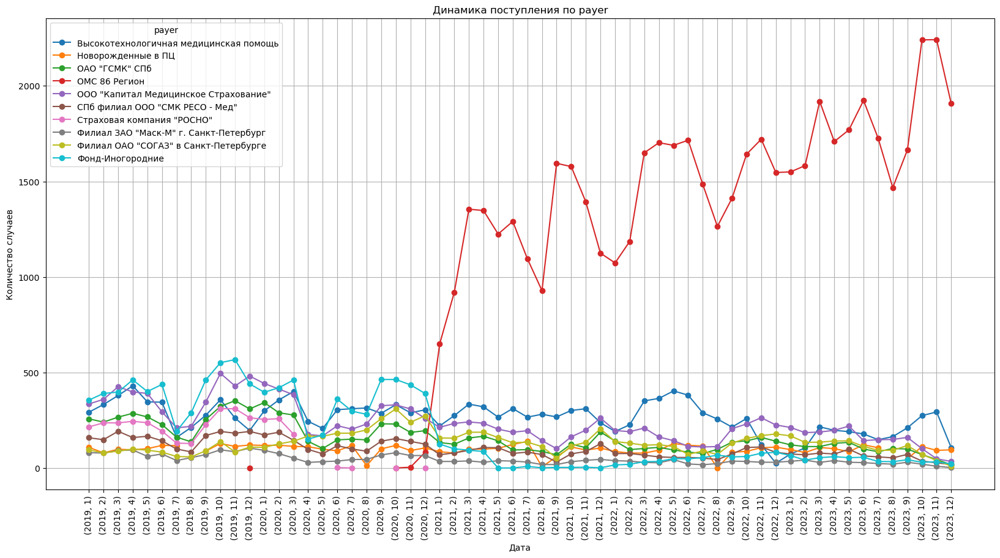

In [63]:
pay = impact_analysis('payer')

ОМС 86 Регион - самый популярный плательщик, однако имеет среднее время ожидания намного выше среднего по выборке (31.48 дней против 18.08 среднее по выборке). День в день обслуживаются Новорожденные в ПЦ. Намного быстрее проходит ожидание через плательщика ООО "Капитал Медицинское Страхование" - среднее время 3.71 дня, хоть он и относится к ОМС. До ноября 2020 года ОМС 86 Регион не являлся плательщиком в больнице, тогда лидировали Фонд-иногородние и ООО "Капитал Медицинское Страхование". Сейчас с подавляющим преимуществом оплаты проходят от ОМС 86 Регион, причем динамика продолжает расти.

### Влияние плановой/экстренной госпитализации

Посмотрим влияет ли на время ожидания плановая ли была госпитализация.

,is_plan,count,nunique,mean,median
0,Плановая,93227,53297,26.83,1.00
1,Экстренная,46091,40386,0.39,0.00


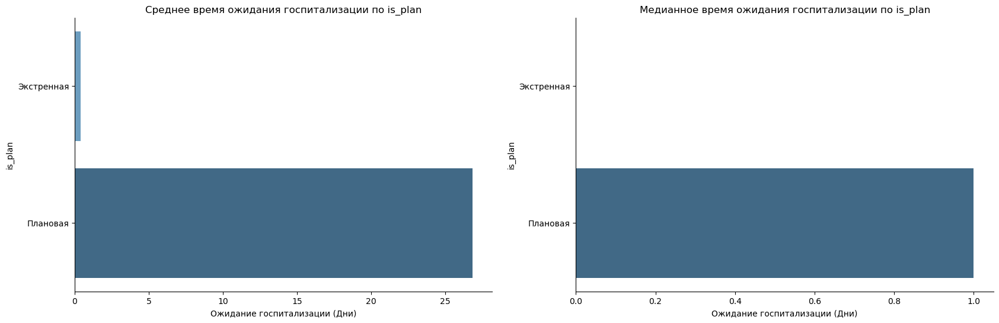

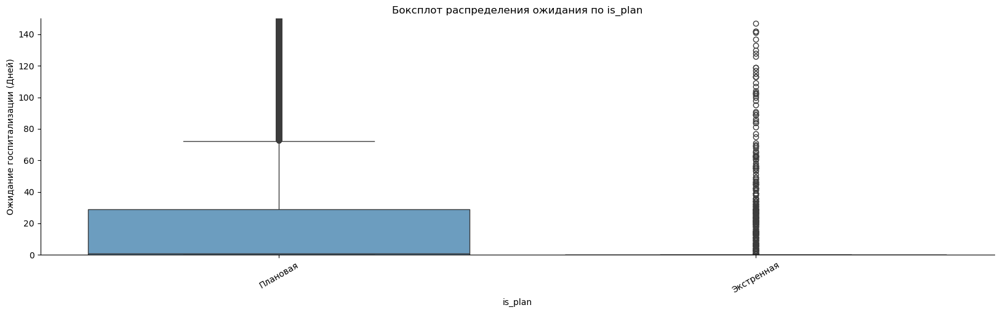

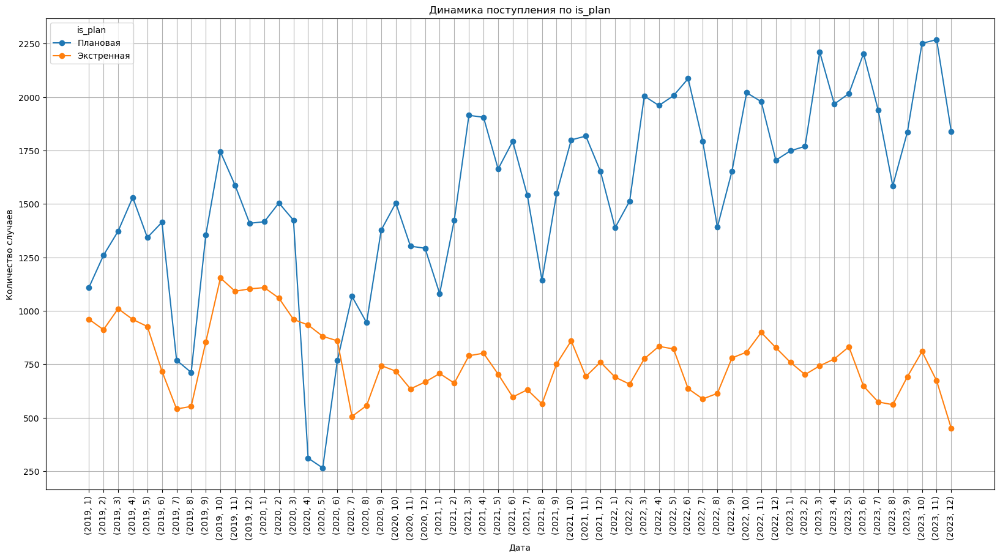

In [64]:
plan = impact_analysis('is_plan')

Очевидна существенная разница во времени ожидания госпитализации. Среднее время экстренной - 0.39 дня, плановой - 26.83 дня. Однако есть выбросы по каждой из выборок. Есть случаи, когда пациент более 100 дней ждет экстренную госпитализацию. В апреле-июне 2020 года плановых госпитализаций было меньше экстренных. Возможно на эти месяцы большинство отделений держали в запасе места на случай экстренной госпитализации пациентов с коронавирусом. В остальные месяцы плановых госпитализаций было гораздо больше экстренных. Пик экстренных приходится на октябрь 2019 - июнь 2020.

### Влияние отделения

,dept,count,nunique,mean,median
0,Кожно-венерологическое О,10583,3901,20.90,0.00
1,ПЭМП ДПО,10479,9941,0.32,0.00
2,Инфекционное О №1,10475,10136,1.19,0.00
3,Педиатрическое О №3,9607,2353,22.56,14.00
4,Офтальмологическое,9072,5781,28.56,17.00
5,Хирургическое О №3,8885,7400,18.77,0.00
6,ПЦ Акушерское физиологическое О,7968,7689,0.86,0.00
7,ПЦ О физиологии новорожденных,7609,7608,0.00,0.00
8,Педиатрическое О №2,7503,2669,18.07,14.00
9,Хирургическое О №1,7132,4613,46.42,0.00


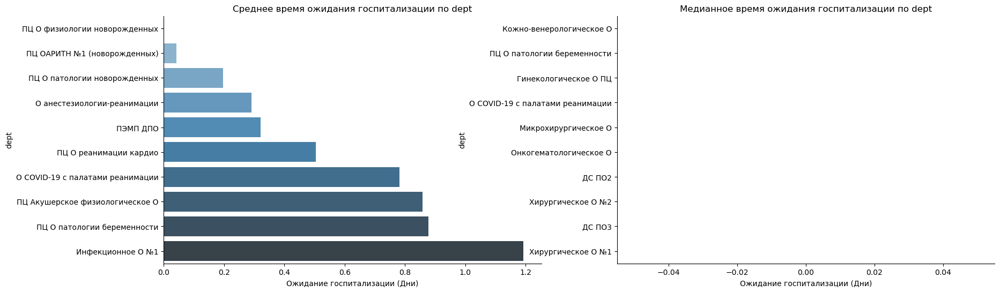

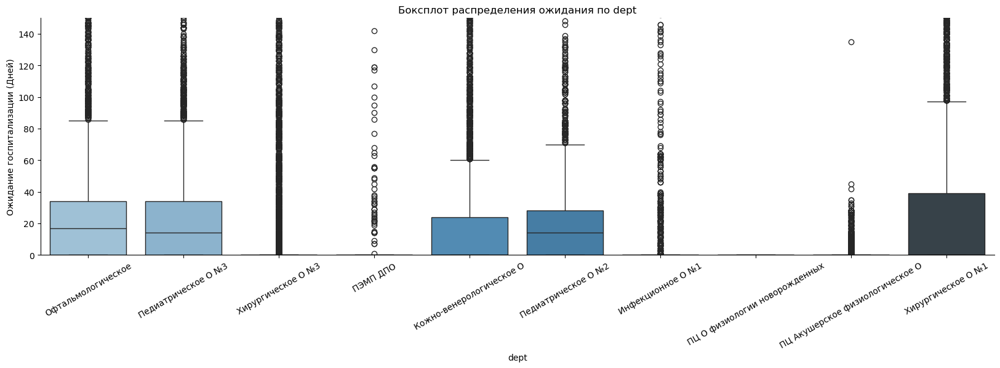

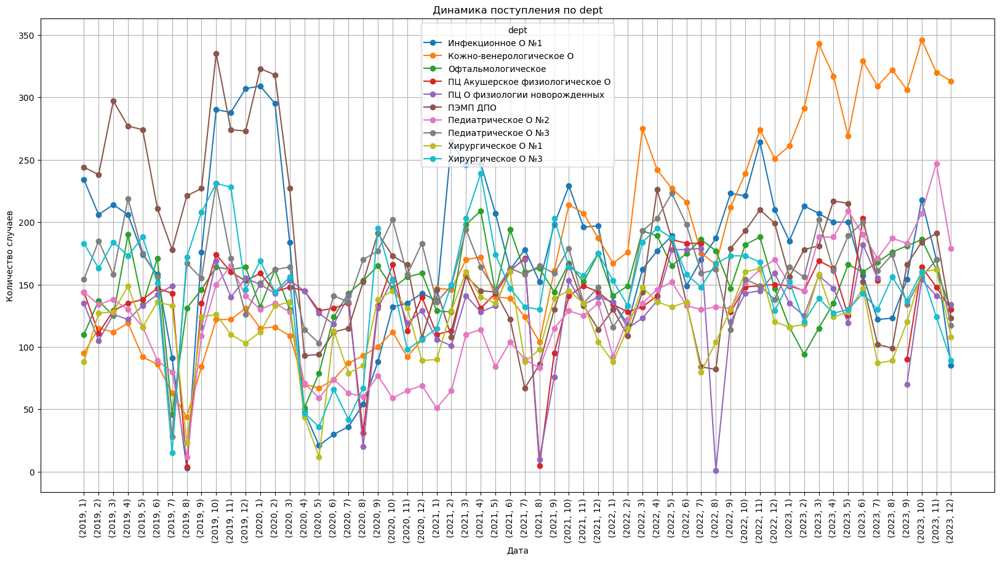

In [65]:
dept = impact_analysis('dept')

Самое невысокое время ожидания в ПЦ физиологии новорожденных (7609 случаев), все случаи 0 дней ожидания. Самое популярное отделение - Кожно-венерологическое 10583 случая, среднее время ожидания - 20.9 дней. Начиная с октября 2022 года по декабрь 2023 года Кожно-венерологическое отделение лидирует по количеству пациентов. С октября 2019 по март 2020 лидировали с отрывом Инфекционное отделение №1 и ПЭМП ДПО. Также Инфекционное отделение №1 лидировало в начале 2021 года. Опять-таки, скорее всего это связано с эпидемией коронавируса.

### Влияние профиля

,profile,count,nunique,mean,median
0,Инфекционные,12360,11868,2.32,0.00
1,Дерматологические,10563,3899,20.93,0.00
2,Хирургические для детей,9539,8773,5.49,0.00
3,Ревматологические,9150,2165,22.47,14.00
4,Офтальмологические,9072,5781,28.56,17.00
5,Для беременных и рожениц,7968,7689,0.86,0.00
6,Для новорожденных,7609,7608,0.00,0.00
7,Уроандрологические,7132,4613,46.42,0.00
8,Отоларингологические,5973,4845,36.47,1.00
9,Гастроэнтерологические,5312,1740,44.45,26.00


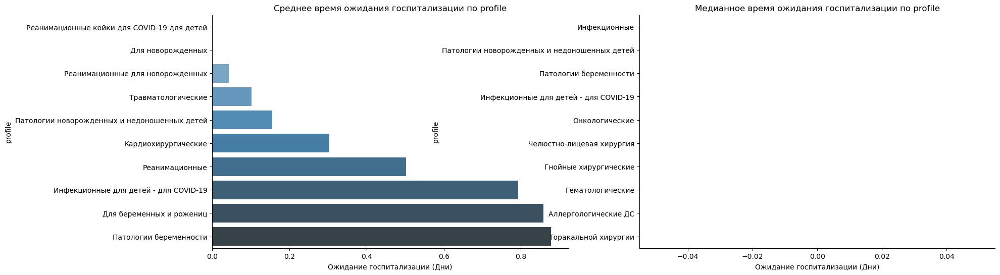

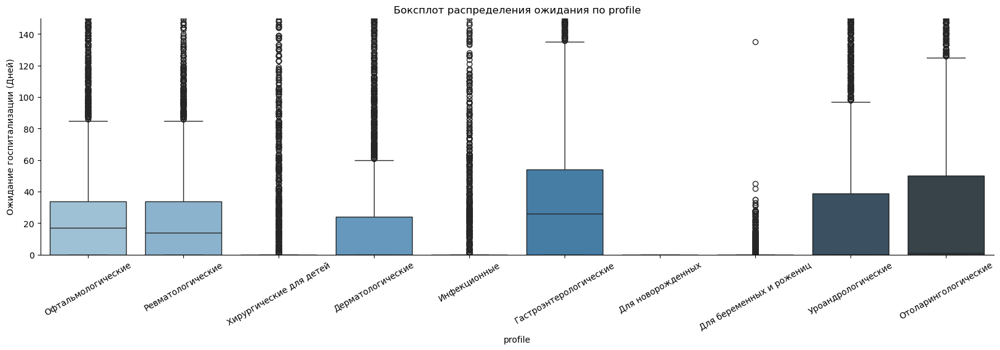

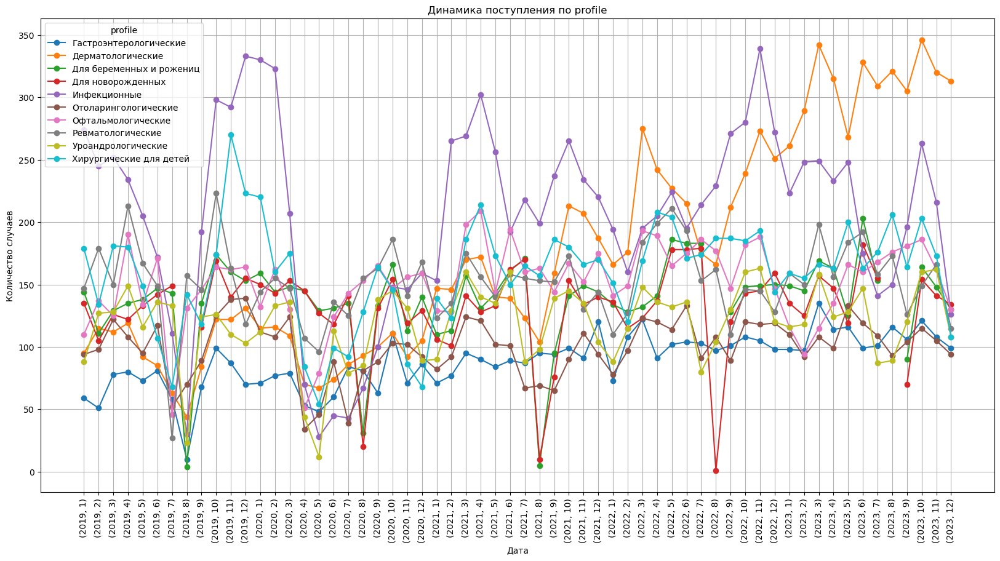

In [66]:
profile = impact_analysis('profile')

По профилю лидируют Инфекционные отделения (12360 случаев). Имеют хороший показатель ожидания госпитализации - среднее время 2.32 дня. Далее идут Дерматологические (10563 случая), но уже со средним временем 20.93 дня. Для новорожденных и койки для детей с COVID-19 имею среднее время госпитализации 0 дней. Заметны всплески в инфекционных отделениях в зимнее время каждого года, скорее всего это связано с холодной погодой и ростом инфекционных и простудных заболеваний. Продолжает расти количество пациентов в дерматологических отделениях - в данный момент это лидер по числу пациентов, начиная с февраля 2023 года. В августе 2021 и августе 2022 наблюдаются резкие спады в отделении для новорожденных.

### Влияние правильности диагноза

,is_mkb_true,count,nunique,mean,median
0,Совпадает,81404,54288,17.67,0.00
1,Поменялся,57914,42518,18.66,0.00


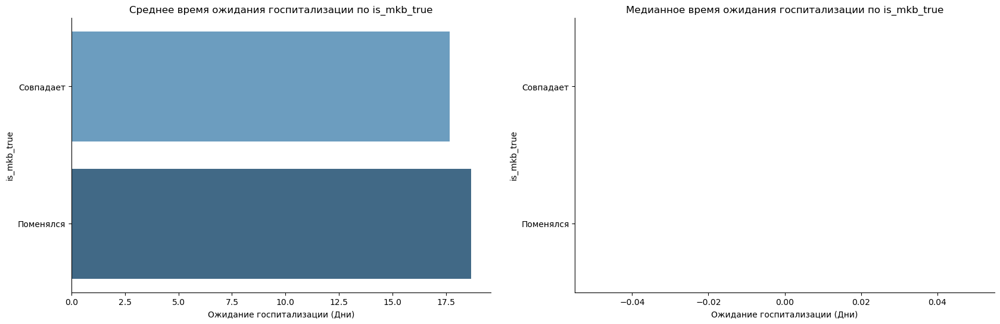

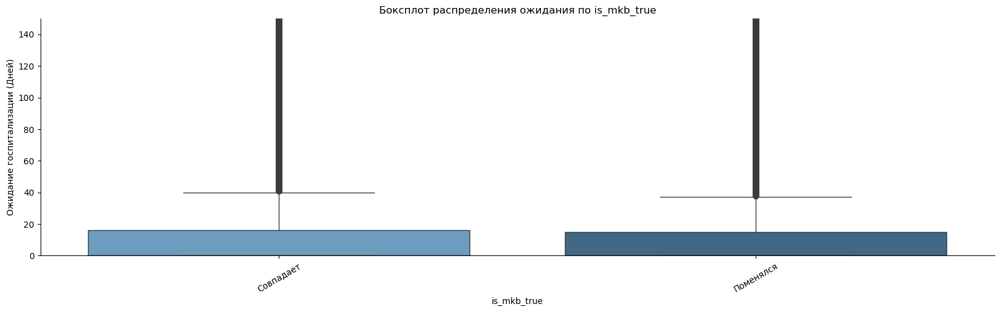

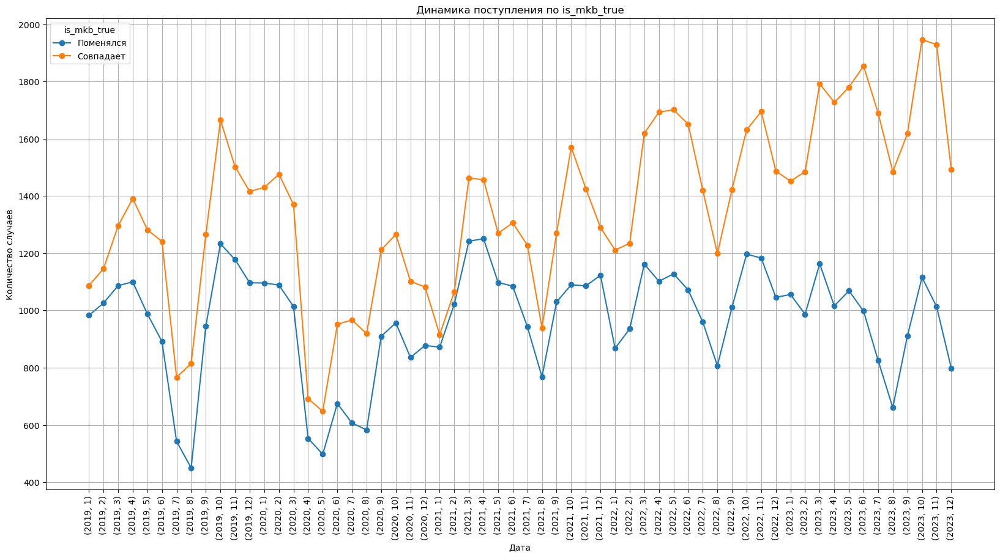

In [67]:
mkb_true = impact_analysis('is_mkb_true')

В 81404 случаях диагноз при поступлении и выписке совпадает. Разница в средних значениях составляет 1 день (17.67 когда диагноз совпадает, 18.66 диагноз поменялся). Наблюдается рост числа совпадающих диагнозов и падение числа диагнозов, которые изменились в ходе лечения. Почему меняется диагноза при поступлении и выписке? Диагноз при поступлении - это предварительный рабочий диагноз, который ставит врач приемного отделения больницы, принимая решение о необходимости госпитализации пациента. За время лечения пациента клинический диагноз может изменяться. Заключительный диагноз – это окончательное заключение лечащего врача медицинской организации о заболеваниях (травмах, патологических процессах), по поводу которых оказывалась медицинская помощь. Заключительный диагноз устанавливают в конце эпизода оказания медицинской помощи Поэтому и есть разница между диагнозами при поступлении и выписке.

### Зависимость с койко-днями

Чтобы посмотреть зависимость, построим диаграмму рассеяния. По оси X будет ожидание госпитализации, по оси Y койко-дни:

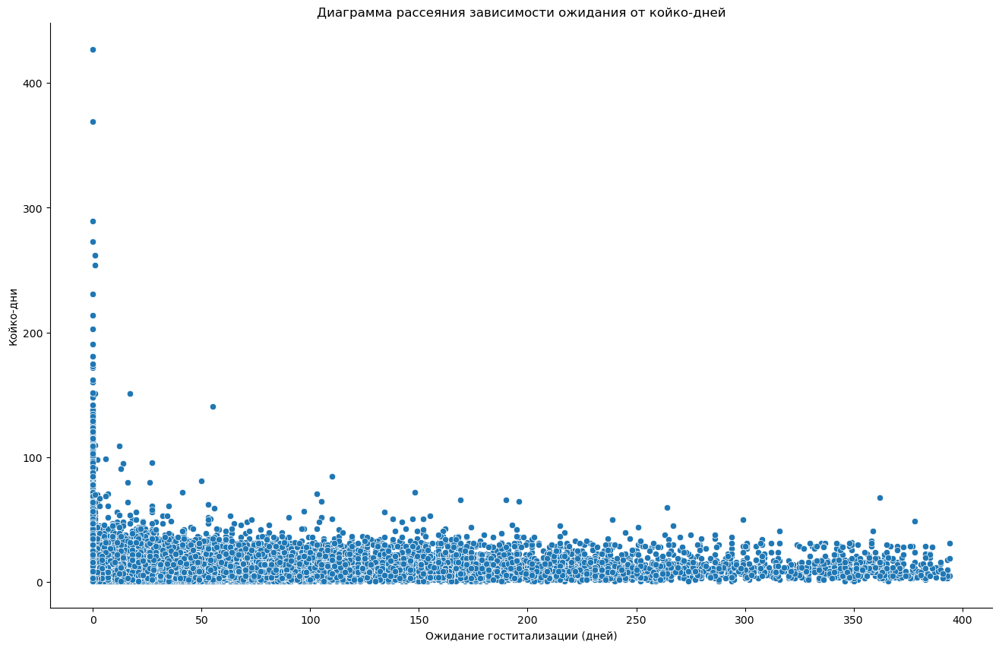

In [68]:
plt.figure(figsize=(16,10))
fig = sns.scatterplot(data=clean, y='bed_days', x='waiting_days')
fig.set_title('Диаграмма рассеяния зависимости ожидания от койко-дней')
fig.set_xlabel('Ожидание гоститализации (дней)')
fig.set_ylabel('Койко-дни')
sns.despine()

Пациенты, которые находятся на госпитализации более 100 дней, попадают в отделение в первые сутки после выдачи направления. Прослеживается зависимость - чем больше ожидание, тем меньше койко-дней.

### Влияние диагноза при поступлении

,income_mkb,count,nunique,mean,median
0,M08.0,6126,1519,21.75,14.00
1,L20.8,5419,1790,22.60,13.00
2,Z38.0,5165,5165,0.00,0.00
3,J03.9,4311,4210,0.09,0.00
4,J45.0,3455,765,20.86,18.00
5,B27.9,3076,3040,0.00,0.00
6,L40.0,2825,676,16.22,0.00
7,J06.9,2374,2295,2.25,0.00
8,K37,2368,2331,0.06,0.00
9,K59.0,2239,1440,52.09,0.00


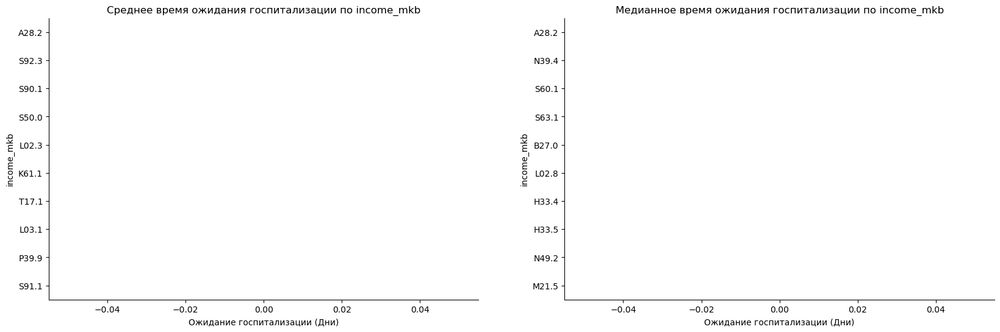

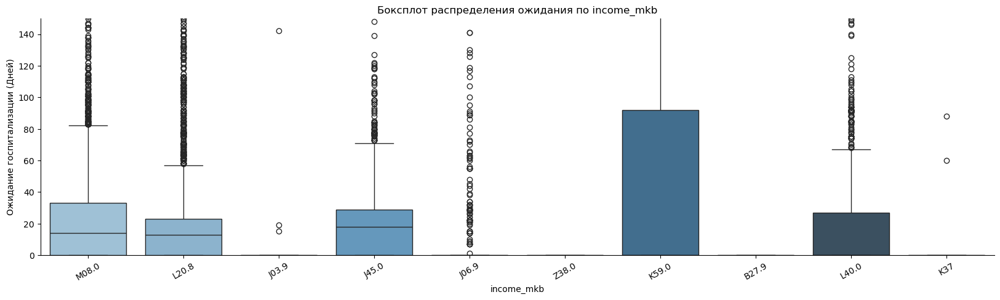

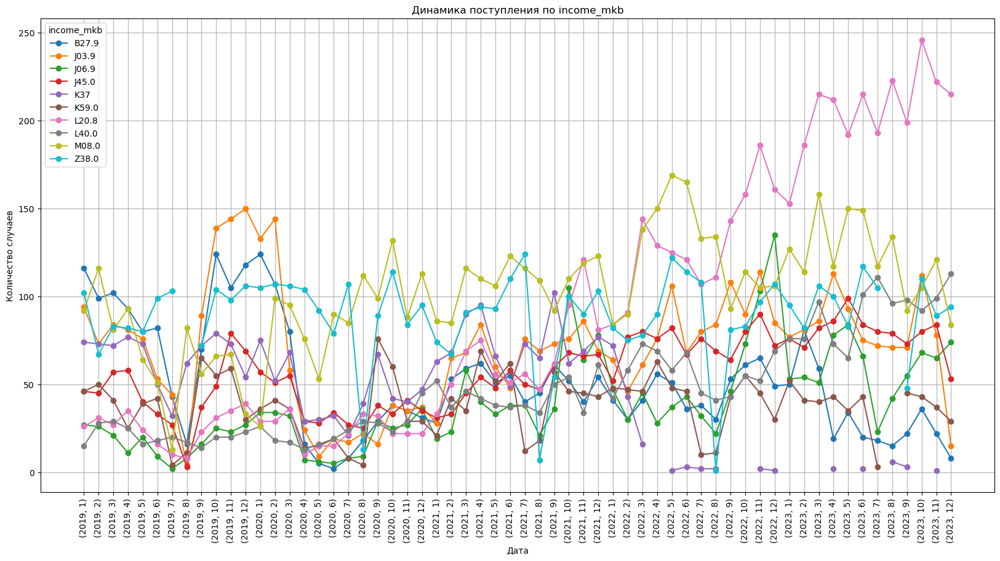

In [69]:
income_m = impact_analysis('income_mkb')

In [70]:
income_m.head(10).merge(mkb_list[['mkb', 'name']], left_on='income_mkb', right_on='mkb', how='left').drop(columns='mkb')

,income_mkb,count,nunique,mean,median,name
0,M08.0,6126,1519,21.75,14.00,Юношеский ревматоидный артрит
1,L20.8,5419,1790,22.60,13.00,Другие атопические дерматиты
2,Z38.0,5165,5165,0.00,0.00,"Один ребенок, рожденный в стационаре"
3,J03.9,4311,4210,0.09,0.00,Острый тонзиллит неуточненный
4,J45.0,3455,765,20.86,18.00,Астма с преобладанием аллергического компонента
5,B27.9,3076,3040,0.00,0.00,Инфекционный мононуклеоз неуточненный
6,L40.0,2825,676,16.22,0.00,Псориаз обыкновенный
7,J06.9,2374,2295,2.25,0.00,Острая инфекция верхних дыхательных путей неут...
8,K37,2368,2331,0.06,0.00,Аппендицит неуточненный
9,K59.0,2239,1440,52.09,0.00,Запор


В последнее время прогрессирует диагноз Другие атопические дерматиты, начиная с сентября 2022 года занимает лидирующую позицию по количеству диагнозов при поступлении. Юношеский ревматоидный артрит стабилен на протяжении всего времени. Инфекционный мононуклеоз неуточненный и Острый тонзиллит неуточненный лидировали в период сентябрь 2019 - март 2020.

### Влияние диагноза при выписке

,outcome_mkb,count,nunique,mean,median
0,L20.8,6818,2448,20.11,4.00
1,Z38.0,5164,5164,0.00,0.00
2,J03.9,4170,4076,0.21,0.00
3,M08.0,3826,980,21.55,14.00
4,O80.0,3578,3449,0.61,0.00
5,J45.0,3487,808,20.18,16.00
6,J06.8,3379,3294,5.42,0.00
7,L40.0,2852,675,15.98,0.00
8,O82.1,2521,2475,0.61,0.00
9,K63.9,2073,2043,0.07,0.00


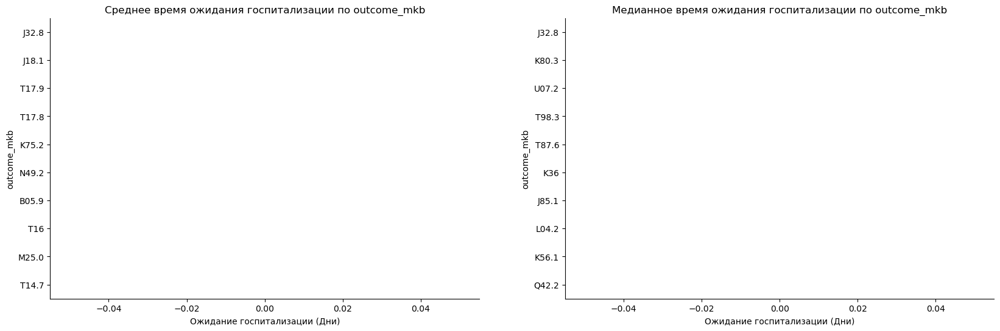

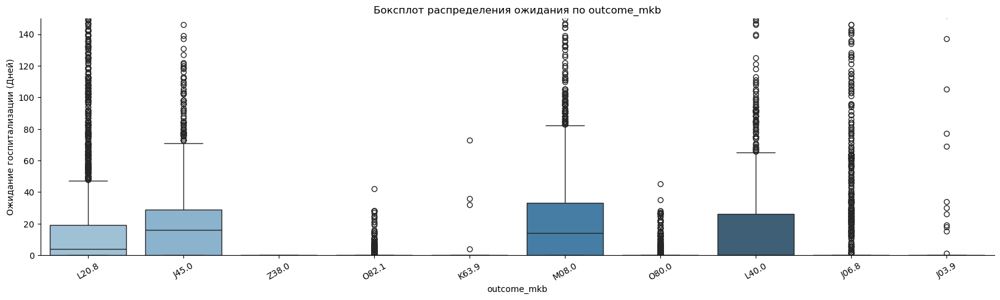

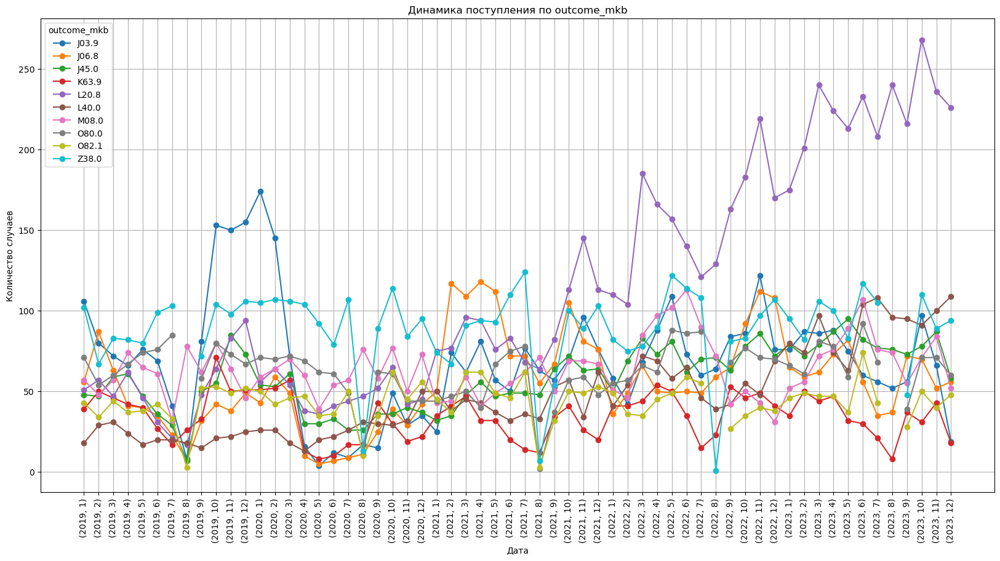

In [71]:
outcome_m = impact_analysis('outcome_mkb')

In [72]:
outcome_m.head(10).merge(mkb_list[['mkb', 'name']], left_on='outcome_mkb', right_on='mkb', how='left').drop(columns='mkb')

,outcome_mkb,count,nunique,mean,median,name
0,L20.8,6818,2448,20.11,4.00,Другие атопические дерматиты
1,Z38.0,5164,5164,0.00,0.00,"Один ребенок, рожденный в стационаре"
2,J03.9,4170,4076,0.21,0.00,Острый тонзиллит неуточненный
3,M08.0,3826,980,21.55,14.00,Юношеский ревматоидный артрит
4,O80.0,3578,3449,0.61,0.00,Самопроизвольные роды в затылочном предлежании
5,J45.0,3487,808,20.18,16.00,Астма с преобладанием аллергического компонента
6,J06.8,3379,3294,5.42,0.00,Другие острые инфекции верхних дыхательных пут...
7,L40.0,2852,675,15.98,0.00,Псориаз обыкновенный
8,O82.1,2521,2475,0.61,0.00,Проведение срочного кесарева сечения
9,K63.9,2073,2043,0.07,0.00,Болезнь кишечника неуточненная


При выписке также наблюдается рост Другие атопические дерматитов начиная аж с сентября 2021 года. Это имеет прямую связь с популярностью кожно-венерологического отделения. Также наблюдается рост диагноза Псориаз обыкновенный. Любопытный факт - в августе каждого года наблюдается аномально резкий спад числа детей, рожденных в стационаре, а в сентябре число возвращается к привычному значению.

### Дополнительно диагнозы

Дополнительно заказчик просит представить всю возможную информацию по диагнозам: срок лечения, время в ожидании, прочие факторы.

У таблице у нас присутствуют диагнозы при поступлении, которые встречались не менее 30 раз. Сделаем сгруппированную таблицу, в которой будут следующие колонки:
- Диагноз
- Количество случаев диагноза
- Среднее количество дней для лечения
- Среднее количество дней ожидания госпитализации
- Процент "правильных" диагнозов
- Процент плановых операций

Приведем значения is_plan и is_mkb_true к булевому типу данных:

In [73]:
mkb = clean.copy()
mkb.loc[mkb['is_plan']=="Плановая", 'is_plan'] = True
mkb.loc[mkb['is_plan']=="Экстренная", 'is_plan'] = False
mkb.loc[mkb['is_mkb_true']=="Совпадает", 'is_mkb_true'] = True
mkb.loc[mkb['is_mkb_true']=="Поменялся", 'is_mkb_true'] = False

In [74]:
mkb_group = (
    mkb.groupby('income_mkb')
    .agg({'user_id':'count', 'bed_days':'mean', 'waiting_days':'mean', 'is_mkb_true':'sum', 'is_plan':'sum'})
    .sort_values(by='user_id', ascending=False)
    .reset_index()
) # группируем таблицу
mkb_group['mkb_true_percent'] = (mkb_group['is_mkb_true']/mkb_group['user_id']*100).astype('Float64') # процент верных диагнозов
mkb_group['is_plan_percent'] = (mkb_group['is_plan']/mkb_group['user_id']*100).astype('Float64') # процент плановых операций
mkb_group = mkb_group.merge(mkb_list[['mkb', 'name']], left_on='income_mkb', right_on='mkb', how='left') # добавляем названия
mkb_group = mkb_group.rename(columns={'name': 'income_name'}) # переименование колонок
mkb_group = mkb_group.drop(columns=['is_mkb_true', 'is_plan', 'mkb']) # удаление лишних колонок
display(mkb_group.head())
mkb_group.info()
mkb_group.describe()

,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
0,M08.0,6126,8.72,21.75,55.22,96.16,Юношеский ревматоидный артрит
1,L20.8,5419,7.62,22.60,96.31,91.95,Другие атопические дерматиты
2,Z38.0,5165,4.55,0.00,99.98,100.00,"Один ребенок, рожденный в стационаре"
3,J03.9,4311,6.87,0.09,66.62,1.72,Острый тонзиллит неуточненный
4,J45.0,3455,6.19,20.86,92.65,94.73,Астма с преобладанием аллергического компонента


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 580 entries, 0 to 579
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   income_mkb        580 non-null    object 
 1   user_id           580 non-null    int64  
 2   bed_days          580 non-null    Float64
 3   waiting_days      580 non-null    Float64
 4   mkb_true_percent  580 non-null    Float64
 5   is_plan_percent   580 non-null    Float64
 6   income_name       565 non-null    object 
dtypes: Float64(4), int64(1), object(2)
memory usage: 34.1+ KB


,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent
count,580.00,580.00,580.00,580.00,580.00
mean,240.20,9.83,18.59,53.11,65.00
std,568.58,5.59,20.88,30.25,37.15
min,14.00,1.00,0.00,0.00,0.00
25%,38.00,6.19,0.69,26.92,26.92
50%,75.50,9.08,12.96,57.29,85.34
75%,207.00,11.99,30.46,78.57,95.59
max,6126.00,46.29,126.94,100.00,100.00


Получили данные о 580 самых распространенных диагнозах.

#### Функция для анализа диагнозов

Построим функцию для анализа диагнозов при поступлении. По столбцу группированной таблице она будет возвращать 2 таблицы наибольшими и наименьшими значениями. А также столбчатую диаграмму по полученным таблицам.

In [75]:
'''
Фукция принимает на вход колонку из таблицы mkb_group (col), по которой необходимо оценить диагнозы.
На выходе получаем таблицы топ-10 высоких и наименьших значений по показателю.
Также получаем 2 столбчатые диаграммы с топ-10 на основании данных из таблицы.
'''
def top_head_tail(col):
    head = mkb_group.sort_values(by=col, ascending=False).head(10)
    display(head) # таблица топ-10 наивысших по показателю диагнозов
    
    plt.figure(figsize=(20,6))
    ax1 = plt.subplot(1, 2, 1) # график топ-10 наивысших по показателю диагнозов
    fig = sns.barplot(
        data=head,
        y='income_mkb',
        x=col,
        palette='Blues_d',
        hue='income_mkb',
        ax=ax1
    )
    fig.set_title(f'Больше всего {col}')
    fig.set_xlabel(f'{col}')
    fig.set_ylabel('Диагноз')
    sns.despine()

    tail = mkb_group.sort_values(by=col).head(10)
    display(tail) # таблица топ-10 наименьших по показателю диагнозов

    ax2 = plt.subplot(1, 2, 2)  # график топ-10 наименьших по показателю диагнозов
    fig = sns.barplot(
        data=tail,
        y='income_mkb',
        x=col,
        palette='Blues_d',
        hue='income_mkb',
        ax=ax2
    )
    fig.set_title(f'Меньше всего {col}')
    fig.set_xlabel(f'{col}')
    fig.set_ylabel('Диагноз')
    sns.despine()

#### Топ распространненых диагнозов

Применим функцию к столбцу 'user_id':

,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
0,M08.0,6126,8.72,21.75,55.22,96.16,Юношеский ревматоидный артрит
1,L20.8,5419,7.62,22.60,96.31,91.95,Другие атопические дерматиты
2,Z38.0,5165,4.55,0.00,99.98,100.00,"Один ребенок, рожденный в стационаре"
3,J03.9,4311,6.87,0.09,66.62,1.72,Острый тонзиллит неуточненный
4,J45.0,3455,6.19,20.86,92.65,94.73,Астма с преобладанием аллергического компонента
5,B27.9,3076,7.74,0.00,2.18,1.85,Инфекционный мононуклеоз неуточненный
6,L40.0,2825,7.19,16.22,96.46,85.10,Псориаз обыкновенный
7,J06.9,2374,5.69,2.25,23.50,3.29,Острая инфекция верхних дыхательных путей неут...
8,K37,2368,4.69,0.06,0.21,0.46,Аппендицит неуточненный
9,K59.0,2239,11.58,52.09,47.57,58.55,Запор


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
579,D84.0,14,14.21,13.64,7.14,92.86,Дефект функционального антигена-1 лимфоцитов [...
578,Q67.8,16,12.56,31.12,43.75,93.75,Другие врожденные деформации грудной клетки
576,M41.1,18,20.89,17.33,72.22,100.00,Юношеский идиопатический сколиоз
577,G70.0,18,13.72,31.28,66.67,94.44,Myasthenia gravis
575,M80.5,22,7.59,59.27,50.00,100.00,Идиопатический остеопороз с патологическим пер...
574,Q30.0,23,13.70,32.91,47.83,95.65,Атрезия хоан
573,H35.1,23,13.83,29.52,13.04,82.61,Преретинопатия
572,H33.2,23,9.04,23.39,52.17,52.17,Серозная отслойка сетчатки
571,M30.0,23,13.30,12.83,34.78,100.00,Узелковый полиартериит
570,G40.1,24,11.12,17.33,4.17,91.67,Локализованная (фокальная) (парциальная) симпт...


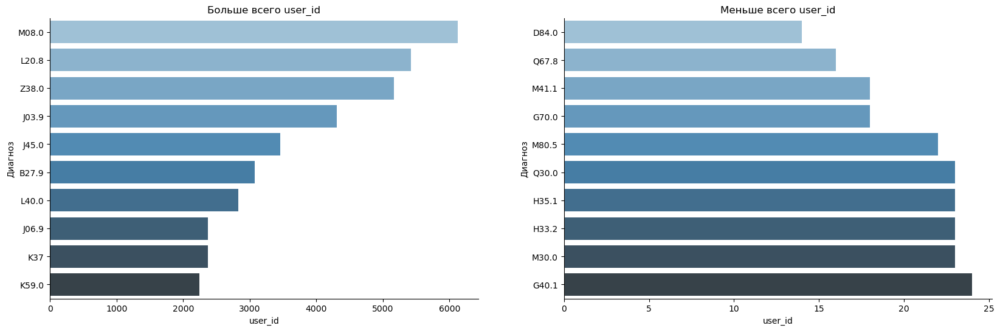

In [76]:
top_head_tail('user_id')

Топ самых популярных диагнозов - Юношеский ревматоидный артрит (6126 случаев), Другие атопические дерматиты (5419) и Один ребенок, рожденный в стационаре (5165). Самый редкий диагноз, который мы оставили в таблице - Дефект функционального антигена-1 лимфоцитов (14 случаев).

#### Диагнозы по сроку лечения

,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
460,Q89.7,34,46.29,0.21,47.06,67.65,"Множественные врожденные аномалии, не классифи..."
144,P22.0,207,39.60,0.00,23.67,28.99,Синдром дыхательного расстройства у новорожден...
482,Q79.3,32,33.91,0.03,62.50,28.12,Гастрошиз
522,Z93.2,29,32.03,14.93,48.28,86.21,Наличие илеостомы
485,S72.3,32,30.47,0.22,81.25,37.50,Перелом тела [диафиза] бедренной кости
473,K76.9,33,28.58,19.48,15.15,66.67,Болезнь печени неуточненная
376,J44.8,50,28.20,10.16,50.00,86.00,Другая уточненная хроническая обструктивная ле...
103,I89.0,283,27.62,126.94,95.05,95.41,"Лимфоотек, не классифицированный в других рубр..."
248,Q39.1,93,27.18,14.63,64.52,61.29,Атрезия пищевода с трахеально-пищеводным свищем
506,Q24.9,31,26.29,0.10,9.68,35.48,Врожденный порок сердца неуточненный


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
380,T79.6,49,1.00,0.00,91.84,0.00,Травматическая ишемия мышцы
51,S60.0,578,1.06,0.00,97.40,0.00,Ушиб пальца(ев) кисти без повреждения ногтевой...
194,N48.1,133,1.07,0.00,99.25,0.00,Баланопостит
396,S90.1,45,1.11,0.00,97.78,0.00,Ушиб пальца(ев) стопы без повреждения ногтевой...
515,S00.3,30,1.13,0.00,100.00,0.00,Поверхностная травма носа
200,S60.2,125,1.15,0.00,94.40,0.80,Ушиб других частей запястья и кисти
372,S50.1,51,1.16,0.00,94.12,0.00,Ушиб другой и неуточненной части предплечья
399,S50.0,45,1.18,0.00,100.00,0.00,Ушиб локтя
145,S53.0,207,1.18,0.11,97.58,0.48,Вывих головки лучевой кости
312,E74.0,67,1.30,25.19,98.51,91.04,Болезни накопления гликогена


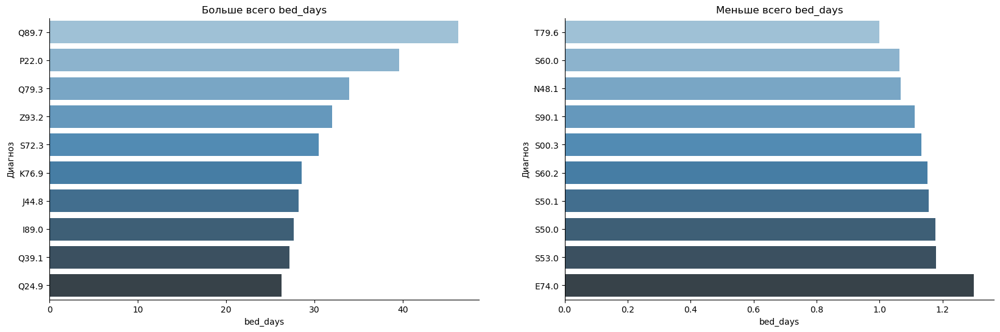

In [77]:
top_head_tail('bed_days')

Дольше всего находятся на госпитализации пациенты с диагнозом Множественные врожденные аномалии (46 дней в среднем), затем Синдром дыхательного расстройства (39 дней в среднем). Все пациенты с Травматическая ишемия мышцы выписываются из отделения день в день.

#### Диагнозы по ожиданию госпитализации

,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
103,I89.0,283,27.62,126.94,95.05,95.41,"Лимфоотек, не классифицированный в других рубр..."
108,K76.6,272,18.43,109.20,90.44,89.34,Портальная гипертензия
263,I83.9,88,13.74,104.34,93.18,93.18,Варикозное расширение вен нижних конечностей б...
201,K73.2,124,15.50,99.52,87.90,98.39,"Хронический активный гепатит, не классифициров..."
375,Q54.9,50,16.86,91.72,2.00,98.00,Гипоспадия неуточненная
324,Q53.0,64,9.77,89.23,10.94,98.44,Эктопическое яичко
471,L80,33,13.64,86.55,39.39,96.97,Витилиго
546,Q61.8,27,10.63,83.70,37.04,92.59,Другие кистозные болезни почек
139,Q54.0,214,15.41,79.83,64.95,99.07,Гипоспадия головки полового члена
104,Q53.2,282,10.02,79.45,23.05,99.29,Неопущение яичка двустороннее


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
289,A28.2,76,8.28,0.00,6.58,0.00,Экстраинтестинальный иерсиниоз
395,S92.3,46,4.39,0.00,73.91,0.00,Перелом костей плюсны
396,S90.1,45,1.11,0.00,97.78,0.00,Ушиб пальца(ев) стопы без повреждения ногтевой...
399,S50.0,45,1.18,0.00,100.00,0.00,Ушиб локтя
161,L02.3,182,3.34,0.00,50.00,1.10,"Абсцесс кожи, фурункул и карбункул ягодицы"
412,K61.1,42,5.26,0.00,54.76,2.38,Ректальный абсцесс
418,T17.1,40,1.77,0.00,97.50,0.00,Инородное тело в носовом ходе
421,L03.1,40,4.25,0.00,57.50,0.00,Флегмона других отделов конечностей
426,P39.9,39,23.82,0.00,53.85,58.97,"Инфекция, специфичная для перинатального перио..."
432,S91.1,39,3.95,0.00,76.92,0.00,Открытая рана пальца(ев) стопы без повреждения...


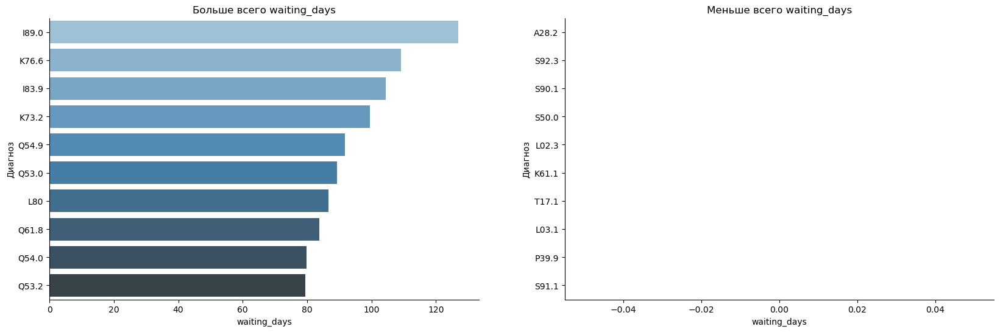

In [78]:
top_head_tail('waiting_days')

Дольше всего госпитализации ждут пациенты с диагнозом Лимфоотек (127 дней в среднем), Портальная гипертензия (109 дней) и Варикозное расширение вен нижних конечностей (104 дня).

In [79]:
print(len(mkb_group.loc[mkb_group['waiting_days']==0]))
mkb_group.loc[mkb_group['waiting_days']==0].head(10)

76


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
2,Z38.0,5165,4.55,0.00,99.98,100.00,"Один ребенок, рожденный в стационаре"
5,B27.9,3076,7.74,0.00,2.18,1.85,Инфекционный мононуклеоз неуточненный
23,K35.8,1098,4.64,0.00,35.97,0.46,NaN
48,P08.1,608,4.72,0.00,99.84,100.00,"Другие ""крупновесные"" для срока дети"
51,S60.0,578,1.06,0.00,97.40,0.00,Ушиб пальца(ев) кисти без повреждения ногтевой...
56,L03.0,496,1.95,0.00,91.33,0.00,Флегмона пальцев кисти и стопы
70,L02.4,419,2.75,0.00,84.49,0.24,"Абсцесс кожи, фурункул и карбункул конечности"
78,A38,377,7.30,0.00,11.67,0.80,Скарлатина
82,N44,351,5.58,0.00,54.99,1.71,Перекручивание яичка
84,P59.8,335,6.01,0.00,99.40,100.00,"Неонатальная желтуха, обусловленная другими ут..."


Сразу 76 диагнозов, по которым берут пациентов день в день.

#### Диагнозы по "правильности"

,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
515,S00.3,30,1.13,0.00,100.00,0.00,Поверхностная травма носа
399,S50.0,45,1.18,0.00,100.00,0.00,Ушиб локтя
309,P08.0,68,4.63,0.00,100.00,100.00,Чрезмерно крупный ребенок
186,Z38.3,146,5.33,0.00,100.00,100.00,"Двойня, рожденная в стационаре"
527,P58.0,29,5.79,0.00,100.00,100.00,"Неонатальная желтуха, обусловленная кровоподте..."
2,Z38.0,5165,4.55,0.00,99.98,100.00,"Один ребенок, рожденный в стационаре"
48,P08.1,608,4.72,0.00,99.84,100.00,"Другие ""крупновесные"" для срока дети"
84,P59.8,335,6.01,0.00,99.40,100.00,"Неонатальная желтуха, обусловленная другими ут..."
194,N48.1,133,1.07,0.00,99.25,0.00,Баланопостит
199,P12.0,127,5.51,0.00,99.21,98.43,Кефалгематома при родовой травме


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
455,E14.1,35,13.71,0.89,0.00,25.71,NaN
491,K73.9,31,23.16,27.16,0.00,87.10,Хронический гепатит неуточненный
257,O24.9,90,8.30,1.84,0.00,100.00,Сахарный диабет при беременности неуточненный
20,O42.9,1190,5.51,0.26,0.00,100.00,Преждевременный разрыв плодных оболочек неуточ...
539,Q35.9,28,12.29,32.82,0.00,96.43,Расщелина неба [волчья пасть] неуточненная одн...
328,J22,62,6.50,0.00,0.00,3.23,Острая респираторная инфекция нижних дыхательн...
511,L20.0,30,10.50,14.83,0.00,80.00,Почесуха Бенье
96,O80.8,298,4.67,0.00,0.00,100.00,Другие самопроизвольные одноплодные роды
483,O41.0,32,8.16,1.47,0.00,100.00,Олигогидрамнион
456,O90.82,35,4.77,0.00,0.00,14.29,NaN


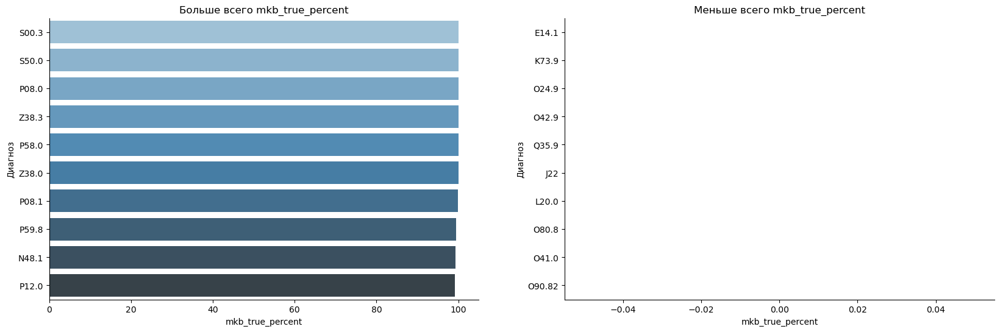

In [80]:
top_head_tail('mkb_true_percent')

Только 5 диагнозов имеют 100% рейтинг правильности. Это Поверхностная травма носа, Ушиб локтя, Чрезмерно крупный ребенок, Двойня, рожденная в стационаре и Неонатальная желтуха.

In [81]:
print(len(mkb_group.loc[mkb_group['mkb_true_percent']==0]))
mkb_group.loc[mkb_group['mkb_true_percent']==0]

10


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
20,O42.9,1190,5.51,0.26,0.00,100.00,Преждевременный разрыв плодных оболочек неуточ...
96,O80.8,298,4.67,0.00,0.00,100.00,Другие самопроизвольные одноплодные роды
257,O24.9,90,8.30,1.84,0.00,100.00,Сахарный диабет при беременности неуточненный
328,J22,62,6.50,0.00,0.00,3.23,Острая респираторная инфекция нижних дыхательн...
455,E14.1,35,13.71,0.89,0.00,25.71,NaN
456,O90.82,35,4.77,0.00,0.00,14.29,NaN
483,O41.0,32,8.16,1.47,0.00,100.00,Олигогидрамнион
491,K73.9,31,23.16,27.16,0.00,87.10,Хронический гепатит неуточненный
511,L20.0,30,10.50,14.83,0.00,80.00,Почесуха Бенье
539,Q35.9,28,12.29,32.82,0.00,96.43,Расщелина неба [волчья пасть] неуточненная одн...


Сразу 10 диагнозов, которые изначально имеют другой диагноз.

#### Процент плановых в разрезе диагнозов

,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
277,Q85.0,82,13.11,50.55,89.02,100.00,Нейрофиброматоз (незлокачественный)
257,O24.9,90,8.30,1.84,0.00,100.00,Сахарный диабет при беременности неуточненный
64,O24.4,443,8.00,1.87,5.87,100.00,"Сахарный диабет, развившийся во время беременн..."
348,Q13.8,55,5.89,37.96,40.00,100.00,Другие врожденные аномалии переднего сегмента ...
335,H26.4,60,6.87,27.40,65.00,100.00,Вторичная катаракта
58,O35.9,476,9.90,2.12,7.56,100.00,"Аномалия и поражение плода, требующие предоста..."
483,O41.0,32,8.16,1.47,0.00,100.00,Олигогидрамнион
327,C81.1,63,12.22,3.14,98.41,100.00,Нодулярный склероз
497,M33.9,31,11.48,23.61,3.23,100.00,Дерматополимиозит неуточненный
501,N07.9,31,11.06,28.58,67.74,100.00,Неуточненное изменение


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
289,A28.2,76,8.28,0.00,6.58,0.00,Экстраинтестинальный иерсиниоз
396,S90.1,45,1.11,0.00,97.78,0.00,Ушиб пальца(ев) стопы без повреждения ногтевой...
449,S22.0,36,8.92,0.00,38.89,0.00,Перелом грудного позвонка
334,S01.8,61,2.34,0.00,93.44,0.00,Открытая рана других областей головы
446,N49.2,36,5.14,0.00,16.67,0.00,Воспалительные болезни мошонки
320,S80.0,64,2.61,0.00,81.25,0.00,Ушиб коленного сустава
51,S60.0,578,1.06,0.00,97.40,0.00,Ушиб пальца(ев) кисти без повреждения ногтевой...
56,L03.0,496,1.95,0.00,91.33,0.00,Флегмона пальцев кисти и стопы
535,S83.6,28,6.18,0.00,32.14,0.00,"Растяжение, разрыв и перенапряжение других и н..."
206,S61.7,119,6.07,0.00,49.58,0.00,Множественные открытые раны запястья и кисти


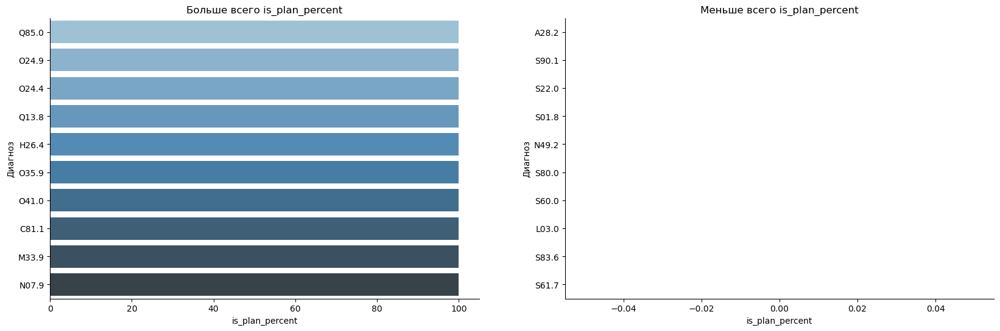

In [82]:
top_head_tail('is_plan_percent')

In [83]:
print(len(mkb_group.loc[mkb_group['is_plan_percent']==0]))
mkb_group.loc[mkb_group['is_plan_percent']==0].head()

29


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
51,S60.0,578,1.06,0.00,97.40,0.00,Ушиб пальца(ев) кисти без повреждения ногтевой...
56,L03.0,496,1.95,0.00,91.33,0.00,Флегмона пальцев кисти и стопы
194,N48.1,133,1.07,0.00,99.25,0.00,Баланопостит
206,S61.7,119,6.07,0.00,49.58,0.00,Множественные открытые раны запястья и кисти
234,S30.1,100,2.47,0.00,90.00,0.00,Ушиб стенки живота


Сразу 29 диагнозов, которые поступают исключительно на экстренную госпитализацию.

In [84]:
print(len(mkb_group.loc[mkb_group['is_plan_percent']==100]))
mkb_group.loc[mkb_group['is_plan_percent']==100].head()

58


,income_mkb,user_id,bed_days,waiting_days,mkb_true_percent,is_plan_percent,income_name
2,Z38.0,5165,4.55,0.00,99.98,100.00,"Один ребенок, рожденный в стационаре"
16,O80.9,1327,4.78,0.24,0.23,100.00,Одноплодные самопроизвольные роды неуточненные
20,O42.9,1190,5.51,0.26,0.00,100.00,Преждевременный разрыв плодных оболочек неуточ...
21,O47.1,1109,5.25,0.30,1.62,100.00,Ложные схватки начиная с 37 полных недель бере...
24,O34.2,1092,7.45,1.35,5.86,100.00,"Послеоперационный рубец матки, требующий предо..."


58 диагнозов имеют 100% показатель плановых госпитализаций.

### Корреляция

С помощью библиотеки phik посмотрим на корреляцию по колонкам, оставим в таблице 50 самых популярных диагнозов при поступлении. Уберем столбцы с плательщиком, датами и профилем отделений.

In [85]:
top_50_income = income.sort_values(by='count', ascending=False).head(50)['income_mkb']
for_corr = (
    clean.loc[clean['income_mkb']
    .isin(top_50_income)]
    [['region', 'fin_source', 'dept', 'bed_days', 'is_plan',
      'income_mkb', 'outcome_mkb', 'is_mkb_true', 'waiting_days']]
)
for_corr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 78069 entries, 2 to 179556
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   region        26542 non-null  object
 1   fin_source    78069 non-null  object
 2   dept          78069 non-null  object
 3   bed_days      78069 non-null  Int64 
 4   is_plan       78069 non-null  object
 5   income_mkb    78069 non-null  object
 6   outcome_mkb   78069 non-null  object
 7   is_mkb_true   78069 non-null  object
 8   waiting_days  78069 non-null  Int64 
dtypes: Int64(2), object(7)
memory usage: 6.1+ MB


Осталось 78069 строк в таблице, по ней и построим матрицу корреляции и хитмэп:

interval columns not set, guessing: ['bed_days', 'waiting_days']


,region,fin_source,dept,bed_days,is_plan,income_mkb,outcome_mkb,is_mkb_true,waiting_days
region,1.00,0.23,0.57,0.09,0.26,0.63,0.68,0.12,0.23
fin_source,0.23,1.00,0.85,0.02,0.44,0.86,0.89,0.34,0.12
dept,0.57,0.85,1.00,0.46,0.89,0.98,0.99,0.70,0.39
bed_days,0.09,0.02,0.46,1.00,0.04,0.41,0.86,0.02,0.02
is_plan,0.26,0.44,0.89,0.04,1.00,0.97,0.96,0.22,0.32
income_mkb,0.63,0.86,0.98,0.41,0.97,1.00,1.00,0.84,0.48
outcome_mkb,0.68,0.89,0.99,0.86,0.96,1.00,1.00,0.97,0.53
is_mkb_true,0.12,0.34,0.70,0.02,0.22,0.84,0.97,1.00,0.02
waiting_days,0.23,0.12,0.39,0.02,0.32,0.48,0.53,0.02,1.00


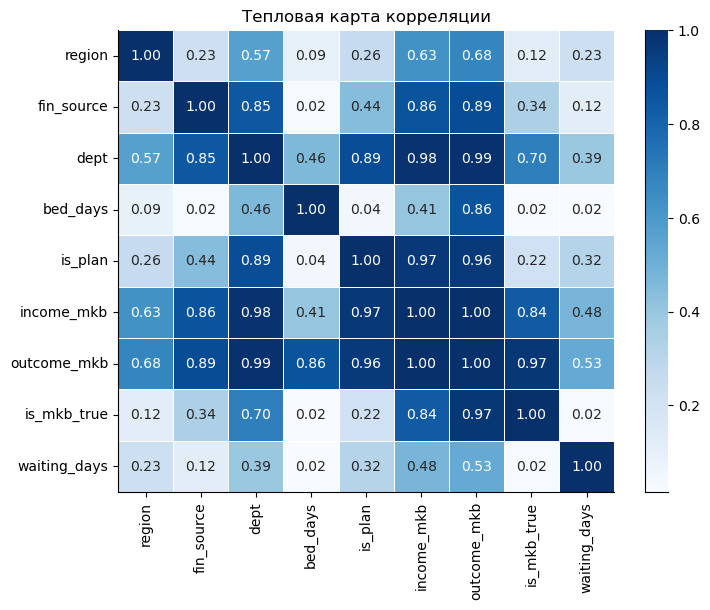

In [86]:
mat = for_corr.phik_matrix()
display(mat)
plt.figure(figsize=(8,6))
fig = sns.heatmap(mat, annot=True, fmt=".2f", linewidth=.5, cmap="Blues")
fig.set_title('Тепловая карта корреляции')
sns.despine()

Нас интересует зависимость waiting_days от других показателей. Матрица не видит зависимости дней ожидания от койко-дней и правильности диагноза (коэффициент корреляции Пирсона равен 0.02), также не видит зависимости с финансовым источником (0.12). Есть небольшая зависимость от региона (0.23) и плановая ли операция (0.32). Еще выше коэффициент Пирсона в зависимости дней ожидания от отделения (0.39). А наилучшая корреляция дней ожидания наблюдается с диагнозами - при поступлении (0.48), при выписке (0.53).

Глядя на таблицу можно сделать вывод, что самым главным параметром при определении количества дней ожидания госпитализации и других показателей является диагноз при выписке. Коэффициент корреляции Пирсона составляет более 0.5 по всем показателям.

### Выводы по аналитической части

- Самый объемный регион Ленинградская область - 23318 записей на 13440 уникальных пациентов. Хороший показатель среднего времени ожидания (16.42 дня) и медианного (0) - это неудивительно, ведь госпиталь располагается в Ленинградской области. Куда удивительней тот факт, что пациенты из Чеченской Республики поступают в госпиталь быстрее всех (среднее время - 11.41), хотя это даже не соседняя область, расстояние от госпиталя более 2000 км. Также быстро поступают пациенты из Республики Дагестан (16.57 дней в среднем). Динамика поступлений по регионам схожая для всех.
- Самое высокое время ожидания у двух самых объемных источников финансирования: ОМС - 19.39 дней среднее время ожидания госпитализации, ВМП - 20.45. Быстрее всего поступают пациенты по наличному расчету - 0.53 дня среднее время. Высокое время ожидание по ОМС связано со сложностью регистрации пациентов. Регистрация проходит в несколько этапов.
- ОМС 86 Регион - самый популярный плательщик, однако имеет среднее время ожидания намного выше среднего по выборке (31.48 дней против 18.08 дней среднее по выборке). День в день обслуживаются Новорожденные в ПЦ. Намного быстрее проходит ожидание через плательщика ООО "Капитал Медицинское Страхование" - среднее время 3.71 дня, хоть он и относится к ОМС. До ноября 2020 года ОМС 86 Регион не являлся лидирующим плательщиком в больнице, тогда лидировали Фонд-иногородние и ООО "Капитал Медицинское Страхование". Сейчас с подавляющим преимуществом оплаты проходят от ОМС 86 Регион, причем динамика продолжает расти.
- Среднее время ожидания экстренной госпитализации - 0.39 дня, плановой - 26.83 дня. Однако есть выбросы по каждой из выборок. Есть случаи, когда пациент более 100 дней ждет экстренную госпитализацию. В апреле-июне 2020 года плановых госпитализаций было меньше экстренных. Возможно на эти месяцы большинство отделений держали в запасе места на случай экстренной госпитализации пациентов с коронавирусом. В остальные месяцы плановых госпитализаций было гораздо больше экстренных. Пик экстренных приходится на октябрь 2019 - июнь 2020.
- Самое невысокое время ожидания в отделении ПЦ физиологии новорожденных (7609 случаев), все случаи - 0 дней ожидания госпитализации. Самое популярное отделение - Кожно-венерологическое 10583 случая, среднее время ожидания - 20.9 дней. Начиная с октября 2022 года по декабрь 2023 года Кожно-венерологическое отделение лидирует по количеству поступлений пациентов. С октября 2019 по март 2020 лидировали с отрывом Инфекционное отделение №1 и ПЭМП ДПО. Также Инфекционное отделение №1 лидировало в начале 2021 года. Опять-таки, скорее всего это связано с эпидемией коронавируса.
- По профилю лидируют Инфекционные отделения (12360 случаев). Имеют хороший показатель ожидания госпитализации - среднее время 2.32 дня. Далее идут Дерматологические (10563 случая), но уже со средним временем 20.93 дня. Профиль Для новорожденных и койки для детей с COVID-19 имею среднее время госпитализации 0 дней. Заметны всплески в инфекционных отделениях в зимнее время каждого года, скорее всего это связано с холодной погодой и ростом инфекционных и простудных заболеваний. Продолжает расти количество пациентов в дерматологических отделениях - в данный момент это лидер по числу пациентов, начиная с февраля 2023 года. В августе 2021 и августе 2022 наблюдаются резкие спады в отделении для новорожденных.
- В 81404 случаях диагноз при поступлении и выписке совпадает. Разница в средних значениях составляет 1 день (17.67 когда диагноз совпадает, 18.66 диагноз поменялся). Наблюдается рост числа совпадающих диагнозов и падение числа диагнозов, которые изменились в ходе лечения. Почему меняется диагноза при поступлении и выписке? Диагноз при поступлении - это предварительный рабочий диагноз, который ставит врач приемного отделения больницы, принимая решение о необходимости госпитализации пациента. За время лечения пациента клинический диагноз может изменяться. Заключительный диагноз – это окончательное заключение лечащего врача медицинской организации о заболеваниях (травмах, патологических процессах), по поводу которых оказывалась медицинская помощь. Заключительный диагноз устанавливают в конце эпизода оказания медицинской помощи. Поэтому и есть разница между диагнозами при поступлении и выписке.
- Пациенты, которые находятся на госпитализации более 100 дней, попадают в отделение в первые сутки после выдачи направления. Прослеживается зависимость - чем больше ожидание, тем меньше койко-дней.
- В последнее время прогрессирует диагноз Другие атопические дерматиты, начиная с сентября 2022 года занимает лидирующую позицию по количеству диагнозов при поступлении. Инфекционный мононуклеоз неуточненный и Острый тонзиллит неуточненный лидировали в период сентябрь 2019 - март 2020.
- При выписке также наблюдается рост диагноза Другие атопические дерматитов начиная аж с сентября 2021 года. Это имеет прямую связь с популярностью кожно-венерологического отделения. Также наблюдается рост диагноза Псориаз обыкновенный. Любопытный факт - в августе каждого года наблюдается аномально резкий спад числа детей, рожденных в стационаре, а в сентябре число возвращается к привычному значению.
- Топ самых популярных диагнозов - Юношеский ревматоидный артрит (6126 случаев), Другие атопические дерматиты (5419) и Один ребенок, рожденный в стационаре (5165).
- Дольше всего находятся на госпитализации пациенты с диагнозом Множественные врожденные аномалии (46 дней в среднем). Все пациенты с диагнозом Травматическая ишемия мышцы выписываются из отделения день в день.
- Дольше всего госпитализации ждут пациенты с диагнозами Лимфоотек (127 дней в среднем), Портальная гипертензия (109 дней) и Варикозное расширение вен нижних конечностей (104 дня).
- Сразу по 76 диагнозам пациентов берут на госпитализацию день в день.
- Только 5 диагнозов имеют 100% показатель правильности. Это Поверхностная травма носа, Ушиб локтя, Чрезмерно крупный ребенок, Двойня, рожденная в стационаре и Неонатальная желтуха.
- Сразу 10 диагнозов изначально имеют другой диагноз.
- 29 диагнозов, по которым пациенты поступают исключительно на экстренную госпитализацию.
- 58 диагнозов имеют 100% показатель плановых госпитализаций.
- Матрица корреляции Пирсона не видит зависимости дней ожидания от койко-дней и правильности диагноза (коэффициент корреляции Пирсона равен 0.02), также не видит зависимости с финансовым источником (0.12). Есть небольшая зависимость от региона (0.23) и плановая ли операция (0.32). Еще выше коэффициент Пирсона в зависимости дней ожидания от отделения (0.39). А наилучшая корреляция дней ожидания наблюдается с диагнозами - при поступлении (0.48), при выписке (0.53). Глядя на таблицу можно сделать вывод, что самым главным параметром при определении количества дней ожидания госпитализации и других показателей является диагноз при выписке. Коэффициент корреляции Пирсона составляет более 0.5 по всем показателям.


<a id='6'></a>
## Проверка гипотез

[В начало проекта](#up)

Сначала проверим данные на нормальность с помощью теста Шапиро-Уилка.

Сформируем гипотезы:

- H0 - данные имеют нормальное распределение
- H1 - распределение не является нормальным

Уровень статистической значимости alpha примем равным 0.05.

In [87]:
alpha = 0.05
res = st.shapiro(clean['waiting_days'])[1]
print(f'Распределение дней ожидания гостпитализации, pvalue:', '{0:.3f}'.format(res))
if res<alpha:
    print('Отвергаем H0: распределение не является нормальным')
else:
    print('Не получилось отвергнуть H0: распределение нормально')

Распределение дней ожидания гостпитализации, pvalue: 0.000
Отвергаем H0: распределение не является нормальным


Выяснили, что в данных много выбросов, а также распределение не является нормальным. Это значит, что мы не можем использовать t-критерий Стьюдента для проверки гипотез. Будем использовать непараметрический тест Манна-Уитни. Его используют для сравнения двух независимых выборок, когда распределение в данных не нормально и в данных есть выбросы.

Сформируем нулевую и альтернативную гипотезы:

- H0 - нет оснований предполагать, что значения дней ожидания госпитализации первой выборки меньше, чем второй.
- H1 - есть основания предполагать, что значения дней ожидания госпитализации первой выборки меньше, чем второй.

Зададим функцию для проверки гипотез. Уровень статистической значимости alpha примем равным 0.05. Используем метод Шидака в качестве поправки на множественную проверку гипотез (Количество тестов равно 11):

#### Функция для проведения теста Манна-Уитни

In [88]:
'''
Функция для проверки статистически значимых различий между выборками при помощи непараметрического теста Манна-Уитни.
На вход принимает 2 выборки: первую (x), в которой мы предполагаем, что среднее значение дней ожидания меньше, чем во второй (y).
Возвращает значение pvalue, решение, отвергаем или принимаем нулевую гипотезу, а также различие в средних между выборками.
'''
def mann_test(x, y):
    alpha = 0.05
    tests = 11
    sidak = 1 - (1-alpha) ** (1/tests)
    pvalue = st.mannwhitneyu(
        x=x,
        y=y,
        alternative="less"
    )[1]
    
    print(
        f'Разница в днях ожидания между выборками:\npvalue:', '{0:.5f}'.format(pvalue)
    )
    
    if pvalue<sidak:
        print('Отвергаем нулевую гипотезу: есть основания предполагать, что значения первой выборки меньше, чем второй')
    else:
        print('Не получилось отвергнуть нулевую гипотезу: нет оснований предполагать, что значения первой выборки меньше, чем второй')
    
    print(
        'Разница в среднем дней ожидания между выборками:',
        '{0:.3f}'.format(x.mean()/y.mean()-1)
    )

**Чеченская Республика и другие**

Проверим гипотезу, что время ожидания госпитализации для пациентов из Чеченской Республики меньше, чем время ожидания пациентов из других регионов.

In [89]:
mann_test(
    clean[clean['region']=='Чеченская Респ']['waiting_days'], 
    clean[clean['region']!='Чеченская Респ']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 0.00000
Отвергаем нулевую гипотезу: есть основания предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: -0.372


Тест нашел значимые различия. Время ожидания госпитализации пациентов из Чеченской Республики меньше, чем время ожидания других регионов.

**Чеченская Республика и Ленинградская область**

In [90]:
mann_test(
    clean[clean['region']=='Чеченская Респ']['waiting_days'], 
    clean[clean['region']=='Ленинградская Обл']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 0.00000
Отвергаем нулевую гипотезу: есть основания предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: -0.305


Тест нашел значимые различия. Время ожидания госпитализации пациентов из Чеченской Республики меньше, чем время ожидания Ленинградской области. Удивительно, ведь госпиталь находится в Ленинградской области.

**Ленинградская область и другие**

In [91]:
mann_test(
    clean[clean['region']=='Ленинградская Обл']['waiting_days'], 
    clean[clean['region']!='Ленинградская Обл']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 0.50031
Не получилось отвергнуть нулевую гипотезу: нет оснований предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: -0.108


Тест не нашел значимых различий. Нет оснований предполагать, что время ожидания пациентов из Ленинградской области меньше, чем из других областей, несмотря на то, что госпиталь находится в Ленинградской области.

**Наличный расчет и другие**

In [92]:
mann_test(
    clean[clean['fin_source']=='Наличный расчет']['waiting_days'], 
    clean[clean['fin_source']!='Наличный расчет']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 0.00000
Отвергаем нулевую гипотезу: есть основания предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: -0.971


Тест нашел значимые отличия. Время ожидания пациентов по наличному расчету существенно ниже времени ожидания пациентов поступающих по другим финансовым источникам.

**ОМС и другие**

In [93]:
mann_test(
    clean[clean['fin_source']=='ОМС']['waiting_days'], 
    clean[clean['fin_source']!='ОМС']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 1.00000
Не получилось отвергнуть нулевую гипотезу: нет оснований предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: 0.530


Среднее время ожидания пациентов из финансового источника ОМС выше, чем у пациентов из других финансовых источников, хоть и большинство пациентов из ОМС.

**Высокотехнологичная медицинская помощь и другие**

In [94]:
mann_test(
    clean[clean['payer']=='Высокотехнологичная медицинская помощь']['waiting_days'], 
    clean[clean['payer']!='Высокотехнологичная медицинская помощь']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 1.00000
Не получилось отвергнуть нулевую гипотезу: нет оснований предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: 0.150


Также и время ожидания госпитализации пациентов плательщика Высокотехнологичная медицинская помощь выше, чем время ожидания пациентов других плательщиков.

**Плановая и экстренная**

In [95]:
mann_test(
    clean[clean['is_plan']=='Экстренная']['waiting_days'], 
    clean[clean['is_plan']=='Плановая']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 0.00000
Отвергаем нулевую гипотезу: есть основания предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: -0.985


Тест нашел значимые отличия, они были видны и невооруженным взглядом. Время ожидания пациентов с экстренной госпитализацией существенно ниже времени ожидания пациентов с плановой госпитализацией.

**Правильность диагноза**

In [96]:
mann_test(
    clean[clean['is_mkb_true']=='Совпадает']['waiting_days'],
    clean[clean['is_mkb_true']=='Поменялся']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 0.52969
Не получилось отвергнуть нулевую гипотезу: нет оснований предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: -0.053


Тест не нашел значимых различий. Нет оснований предполагать, что время ожидания пациентов с "правильным" диагнозом меньше, чем с "неправильным".

**Койко-дни**

Разделим выборки по среднему значению. Сформируем гипотезу, что время ожидание госпитализации пациентами с койко-днями меньше среднего значения ниже, чем время ожидания госпитализации пациентами с койко-днями больше среднего значения.

In [97]:
print('Среднее значение койко-дней:', clean['bed_days'].mean())

Среднее значение койко-дней: 8.202192107265393


In [98]:
mann_test(
    clean[clean['bed_days']<clean['bed_days'].mean()]['waiting_days'], 
    clean[clean['bed_days']>=clean['bed_days'].mean()]['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 0.00000
Отвергаем нулевую гипотезу: есть основания предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: -0.576


Тест нашел значимую разницу. Если количество койко-дней меньше 8, то и ждать госпитализации нужно меньше.

**Инфекционный профиль и другие**

In [99]:
mann_test(
    clean[clean['profile']=='Инфекционные']['waiting_days'], 
    clean[clean['profile']!='Инфекционные']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 0.00000
Отвергаем нулевую гипотезу: есть основания предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: -0.882


Тест нашел значимые отличия. Время ожидания пациентов с инфекционным профилем существенно ниже времени ожидания пациентов с другими профилями.

**Дерматологический профиль и другие**

In [100]:
mann_test(
    clean[clean['profile']=='Дерматологические']['waiting_days'], 
    clean[clean['profile']!='Дерматологические']['waiting_days']
)

Разница в днях ожидания между выборками:
pvalue: 1.00000
Не получилось отвергнуть нулевую гипотезу: нет оснований предполагать, что значения первой выборки меньше, чем второй
Разница в среднем дней ожидания между выборками: 0.173


Не отвергаем гипотезу. Время ожидания пациентов с дерматологический профилем выше времени ожидания пациентов с другими профилями.

### Выводы по проверке гипотез

- Время ожидания госпитализации пациентов из Чеченской Республики меньше, чем время ожидания других регионов.
- Время ожидания госпитализации пациентов из Чеченской Республики меньше, чем время ожидания Ленинградской области.
- Нет оснований предполагать, что время ожидания пациентов из Ленинградской области меньше, чем из других областей, несмотря на то, что госпиталь находится в Ленинградской области.
- Время ожидания пациентов по наличному расчету существенно ниже времени ожидания пациентов, поступающих по другим финансовым источникам.
- Среднее время ожидания пациентов из финансового источника ОМС выше, чем у пациентов из других финансовых источников, хоть и большинство пациентов из ОМС.
- Также и время ожидания госпитализации пациентов плательщика Высокотехнологичная медицинская помощь выше, чем время ожидания пациентов других плательщиков.
- Время ожидания пациентов с экстренной госпитализацией существенно ниже времени ожидания пациентов с плановой госпитализацией.
- Нет оснований предполагать, что время ожидания пациентов с "правильным" диагнозом меньше, чем с "неправильным".
- Если количество койко-дней меньше 8, то и ждать госпитализации нужно меньше.
- Время ожидания пациентов с инфекционным профилем существенно ниже времени ожидания пациентов с другими профилями.
- Время ожидания пациентов с дерматологический профилем выше времени ожидания пациентов с другими профилями.

<a id='7'></a>
## Подготовка отчета в BI-системе DataLens

[В начало проекта](#up)

Ссылка на отчет DataLens: https://datalens.yandex/yuiiscqzr0xul

<a id='8'></a>
## Выводы по работе (рекомендации центру)

На основании данных о госпитализации пациентов медицинского центра я рассчитал длительность в днях, прошедших от выдачи направления до поступления пациента в медицинский центр. Определил, что влияет на длительность. Предоставил информацию по диагнозам: срок лечения, время в ожидании, прочие факторы. А также подготовил отчет в BI-системе DataLens.

В ходе работы я загрузил данные с сервера PostgreSQL, провел предобработку данных, рассчитал длительность в днях, прошедших от выдачи направления до поступления пациента в медицинский центр, провел разведочный анализ данных при помощи библиотеки ydata_profiling, провел исследовательский анализ данных, провел аналитическую часть, определил какие факторы влияют на время поступления пациента, сформировал и проверил гипотезы и выяснил следующее:

**Выводы по исследовательскому анализу:**

- Избавились от выбросов в размере 33836 строк или 19.54% (устранили редко встречающиеся регионы, редких плательщиков и самые редкие диагнозы).
- Имеется 232 аномально высоких значения дней ожидания госпитализации, которые мы не оставляли в очищенном датасете. А также 9 отрицательных показателей дней ожидания, которые мы считаем случаями день в день. Максимальный показатель дней ожидания госпитализации - 394 дня.
- 126 уникальных регионов сократили до 14 самых часто встречающихся. Большинство пациентов госпиталя приходятся на Ленинградскую область - 25690 или 14.84%. Большое количество пациентов из дальних республик (Чеченская, Карелия, Дагестан).
- ОМС 86 Регион - с отрывом самый популярный плательщик с отрывом - 40.12% случаев оплачивает именно он. Высокотехнологичная медицинская помощь на втором месте - 12.04%.
- Всего 9 финансовых источников. 80.57% приходятся на источник ОМС.
- 35 уникальных отделений. 
Отделения имеют высокую корреляцию с колонкой профиля и колонкой плановая ли операция Самое часто встречающееся отделение - Педиатрическое 3 (12890 случаев).
- Больше всего инфекционных (13957) и ревматологических (12053) профилей.
- Плановых поступлений более чем в два раза больше, нежели экстренных. 67.9% против 32.1%.
- В 56.3% случаев диагноз на входе совпадает с диагнозом на выходе.
- 3487 уникальных диагнозов при поступлении. 3128 уникальных диагноза при выписке.
- Самый часто встречающийся диагноз при поступлении - Юношеский ревматоидный артрит - 7497 или 4.33%, далее идут Другие атопические дерматиты (5774) и Один ребенок, рожденный в стационаре (5511).
- При выписке - Другие атопические дерматиты - 7435 случаев или 4.29%. Далее идет Один ребенок, рожденный в стационаре - 5511 случаев и Юношеский ревматоидный артрит - 4772 случаев.
- Создали очищенный датасет. Количество уникальных пользователей в очищенном датасете - 86911, уникальных регионов - 14, финансовых источников - 6, диагнозов при поступлении - 580, при выписке - 2013. Среднее число койко-дней в очищенном датасете - 8.2, медианное - 7. Среднее число дней ожидания госпитализации - 18.08, медианное - 0 дней.

**Выводы по проверке гипотез:**
- Время ожидания госпитализации пациентов из Чеченской Республики меньше, чем время ожидания других регионов.
- Время ожидания госпитализации пациентов из Чеченской Республики меньше, чем время ожидания Ленинградской области.
- Нет оснований предполагать, что время ожидания пациентов из Ленинградской области меньше, чем из других областей, несмотря на то, что госпиталь находится в Ленинградской области.
- Время ожидания пациентов по наличному расчету существенно ниже времени ожидания пациентов, поступающих по другим финансовым источникам.
- Среднее время ожидания пациентов из финансового источника ОМС выше, чем у пациентов из других финансовых источников, хоть и большинство пациентов из ОМС.
- Также и время ожидания госпитализации пациентов плательщика Высокотехнологичная медицинская помощь выше, чем время ожидания пациентов других плательщиков.
- Время ожидания пациентов с экстренной госпитализацией существенно ниже времени ожидания пациентов с плановой госпитализацией.
- Нет оснований предполагать, что время ожидания пациентов с "правильным" диагнозом меньше, чем с "неправильным".
- Если количество койко-дней меньше 8, то и ждать госпитализации нужно меньше.
- Время ожидания пациентов с инфекционным профилем существенно ниже времени ожидания пациентов с другими профилями.
- Время ожидания пациентов с дерматологическим профилем выше времени ожидания пациентов с другими профилями.

**Выводы по аналитической части:**

- Самый объемный регион Ленинградская область - 23318 записей на 13440 уникальных пациентов. Хороший показатель среднего времени ожидания (16.42 дня) и медианного (0) - это неудивительно, ведь госпиталь располагается в Ленинградской области. Куда удивительней тот факт, что пациенты из Чеченской Республики поступают в госпиталь быстрее всех (среднее время - 11.41), хотя это даже не соседняя область, расстояние от госпиталя более 2000 км. Также быстро поступают пациенты из Республики Дагестан (16.57 дней в среднем). Динамика поступлений по регионам схожая для всех.
- Самое высокое время ожидания у двух самых объемных источников финансирования: ОМС - 19.39 дней среднее время ожидания госпитализации, ВМП - 20.45. Быстрее всего поступают пациенты по наличному расчету - 0.53 дня среднее время. Высокое время ожидание по ОМС связано со сложностью регистрации пациентов. Регистрация проходит в несколько этапов.
- ОМС 86 Регион - самый популярный плательщик, однако имеет среднее время ожидания намного выше среднего по выборке (31.48 дней против 18.08 дней среднее по выборке). День в день обслуживаются Новорожденные в ПЦ. Намного быстрее проходит ожидание через плательщика ООО "Капитал Медицинское Страхование" - среднее время 3.71 дня, хоть он и относится к ОМС. До ноября 2020 года ОМС 86 Регион не являлся лидирующим плательщиком в больнице, тогда лидировали Фонд-иногородние и ООО "Капитал Медицинское Страхование". Сейчас с подавляющим преимуществом оплаты проходят от ОМС 86 Регион, причем динамика продолжает расти.
- Среднее время ожидания экстренной госпитализации - 0.39 дня, плановой - 26.83 дня. Однако есть выбросы по каждой из выборок. Есть случаи, когда пациент более 100 дней ждет экстренную госпитализацию. В апреле-июне 2020 года плановых госпитализаций было меньше экстренных. Возможно на эти месяцы большинство отделений держали в запасе места на случай экстренной госпитализации пациентов с коронавирусом. В остальные месяцы плановых госпитализаций было гораздо больше экстренных. Пик экстренных приходится на октябрь 2019 - июнь 2020.
- Самое невысокое время ожидания в отделении ПЦ физиологии новорожденных (7609 случаев), все случаи - 0 дней ожидания госпитализации. Самое популярное отделение - Кожно-венерологическое 10583 случая, среднее время ожидания - 20.9 дней. Начиная с октября 2022 года по декабрь 2023 года Кожно-венерологическое отделение лидирует по количеству поступлений пациентов. С октября 2019 по март 2020 лидировали с отрывом Инфекционное отделение №1 и ПЭМП ДПО. Также Инфекционное отделение №1 лидировало в начале 2021 года. Опять-таки, скорее всего это связано с эпидемией коронавируса.
- По профилю лидируют Инфекционные отделения (12360 случаев). Имеют хороший показатель ожидания госпитализации - среднее время 2.32 дня. Далее идут Дерматологические (10563 случая), но уже со средним временем 20.93 дня. Профиль Для новорожденных и койки для детей с COVID-19 имею среднее время госпитализации 0 дней. Заметны всплески в инфекционных отделениях в зимнее время каждого года, скорее всего это связано с холодной погодой и ростом инфекционных и простудных заболеваний. Продолжает расти количество пациентов в дерматологических отделениях - в данный момент это лидер по числу пациентов, начиная с февраля 2023 года. В августе 2021 и августе 2022 наблюдаются резкие спады в отделении для новорожденных.
- В 81404 случаях диагноз при поступлении и выписке совпадает. Разница в средних значениях составляет 1 день (17.67 когда диагноз совпадает, 18.66 диагноз поменялся). Наблюдается рост числа совпадающих диагнозов и падение числа диагнозов, которые изменились в ходе лечения. Почему меняется диагноза при поступлении и выписке? Диагноз при поступлении - это предварительный рабочий диагноз, который ставит врач приемного отделения больницы, принимая решение о необходимости госпитализации пациента. За время лечения пациента клинический диагноз может изменяться. Заключительный диагноз – это окончательное заключение лечащего врача медицинской организации о заболеваниях (травмах, патологических процессах), по поводу которых оказывалась медицинская помощь. Заключительный диагноз устанавливают в конце эпизода оказания медицинской помощи. Поэтому и есть разница между диагнозами при поступлении и выписке.
- Пациенты, которые находятся на госпитализации более 100 дней, попадают в отделение в первые сутки после выдачи направления. Прослеживается зависимость - чем больше ожидание, тем меньше койко-дней.
- В последнее время прогрессирует диагноз Другие атопические дерматиты, начиная с сентября 2022 года занимает лидирующую позицию по количеству диагнозов при поступлении. Инфекционный мононуклеоз неуточненный и Острый тонзиллит неуточненный лидировали в период сентябрь 2019 - март 2020.
- При выписке также наблюдается рост диагноза Другие атопические дерматитов начиная аж с сентября 2021 года. Это имеет прямую связь с популярностью кожно-венерологического отделения. Также наблюдается рост диагноза Псориаз обыкновенный. Любопытный факт - в августе каждого года наблюдается аномально резкий спад числа детей, рожденных в стационаре, а в сентябре число возвращается к привычному значению.
- Топ самых популярных диагнозов - Юношеский ревматоидный артрит (6126 случаев), Другие атопические дерматиты (5419) и Один ребенок, рожденный в стационаре (5165).
- Дольше всего находятся на госпитализации пациенты с диагнозом Множественные врожденные аномалии (46 дней в среднем). Все пациенты с диагнозом Травматическая ишемия мышцы выписываются из отделения день в день.
- Дольше всего госпитализации ждут пациенты с диагнозами Лимфоотек (127 дней в среднем), Портальная гипертензия (109 дней) и Варикозное расширение вен нижних конечностей (104 дня).
- Сразу по 76 диагнозам пациентов берут на госпитализацию день в день.
- Только 5 диагнозов имеют 100% показатель правильности. Это Поверхностная травма носа, Ушиб локтя, Чрезмерно крупный ребенок, Двойня, рожденная в стационаре и Неонатальная желтуха.
- Сразу 10 диагнозов изначально имеют другой диагноз.
- 29 диагнозов, по которым пациенты поступают исключительно на экстренную госпитализацию.
- 58 диагнозов имеют 100% показатель плановых госпитализаций.
- Матрица корреляции Пирсона не видит зависимости дней ожидания от койко-дней и правильности диагноза (коэффициент корреляции Пирсона равен 0.02), также не видит зависимости с финансовым источником (0.12). Есть небольшая зависимость от региона (0.23) и плановая ли операция (0.32). Еще выше коэффициент Пирсона в зависимости дней ожидания от отделения (0.39). А наилучшая корреляция дней ожидания наблюдается с диагнозами - при поступлении (0.48), при выписке (0.53). Глядя на таблицу можно сделать вывод, что самым главным параметром при определении количества дней ожидания госпитализации и других показателей является диагноз при выписке. Коэффициент корреляции Пирсона составляет более 0.5 по всем показателям.

**Рекомендации центру:**
- Исходя из того, что наибольшее влияние на количество дней ожидания госпитализации и на другие факторы оказывает диагноз при выписке пациента из госпиталя, рекомендуется приложить все усилия, чтобы минимизировать ошибку при первичной постановке диагноза пациента.
- Наблюдается высокая задержка по госпитализации пациентов проходящих через плательщика ОМС 86 Регион (а это 40% от всех пациентов и динамика продолжает расти). Этот момент рекомендуется обсудить на уровне плательщика. Возможно, есть способы скорректировать процесс регистрации и оплаты для пациентов, поступающих через ОМС 86 Регион.
- При записи пациентов в базу, попадающих в госпиталь через скорую помощь и другие экстренные случаи, при возможности рекомендуется минимизировать пропуски в графах с датой выдачи направления и регионом для более глубокого анализа времени ожидания пациентами госпитализации.
- Для оценки заполняемости отделений, а также для дальнейшего прогнозирования и корректировки количества мест в отделениях, рекомендуется предоставить данные о количестве койко-мест в отделениях госпиталя.

[В начало проекта](#up)